In [1]:
suppressPackageStartupMessages({
  library(Seurat)
  library(dplyr)
  library(ggplot2)
  library(scCustomize)
  library(scater)
    library(RColorBrewer)
    library(data.table)
    library(stringr)
library(tibble)
    library(tidyr)
    library(scDblFinder)
    library(scCustomize)
})

In [2]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Red Hat Enterprise Linux 8.10 (Ootpa)

Matrix products: default
BLAS/LAPACK: /scratch/gpfs/KANG/hirak/mambaforge/envs/r43/lib/libopenblasp-r0.3.23.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/New_York
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] scDblFinder_1.14.0          tidyr_1.3.1                
 [3] tibble_3.2.1                stringr_1.5.1              
 [5] data.table_1.15.4           RColorBrewer_1.1-3      

In [3]:
fig.size <- function (height, width, res=300) {
    options(repr.plot.height = height, repr.plot.width = width, resolution=res)
}

In [4]:
adr.obj = readRDS(glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/heatmap_objects/mouse_obj.rds'
        )
)

In [5]:
adr.obj@meta.data %>% pull(orig.ident) %>% unique

[1] "het1"  "het2"  "homo1" "homo2" "homo3"

In [6]:
adr.list =  SplitObject(adr.obj, split.by = "orig.ident")

In [7]:
files = c(
    '/scratch/gpfs/KANG/hirak/bayes/tenX_from_Thale/hemi_tumor_Jul_2024/TH_MYCN_38/outs/filtered_feature_bc_matrix.h5',
    '/scratch/gpfs/KANG/hirak/bayes/tenX_from_Thale/hemi_tumor_Jul_2024/TH_MYCN_45/outs/filtered_feature_bc_matrix.h5',
    '/scratch/gpfs/KANG/hirak/bayes/tenX_from_Thale/hemi_tumor_Jul_2024/TH_MYCN_92/outs/filtered_feature_bc_matrix.h5'
)
names(files) = c('het3', 'het4', 'het5')

In [8]:
objs = lapply(files, function(x){
    mat = Read10X_h5(x)
    rownames(mat) = gsub("GRCm38_","", rownames(mat))
    print(head(rownames(mat)))
    SR = CreateSeuratObject(mat)
    SR[["percent.mt"]] <- PercentageFeatureSet(SR, pattern = "^mt-")
    return(SR)
    
})

[1] "mycn___MYCN" "Xkr4"        "Gm1992"      "Gm37381"     "Rp1"        
[6] "Sox17"      


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] "mycn___MYCN" "Xkr4"        "Gm1992"      "Gm37381"     "Rp1"        
[6] "Sox17"      


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] "mycn___MYCN" "Xkr4"        "Gm1992"      "Gm37381"     "Rp1"        
[6] "Sox17"      


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


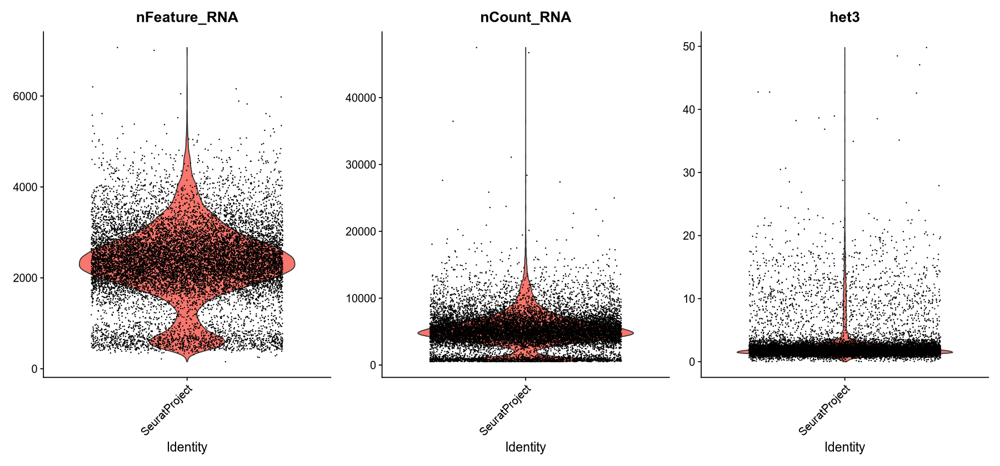

[[1]]

[[2]]

[[3]]


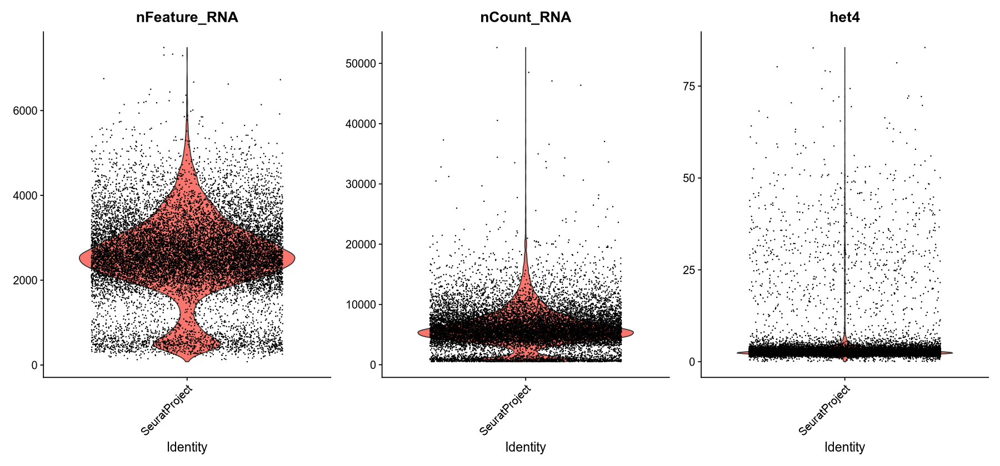

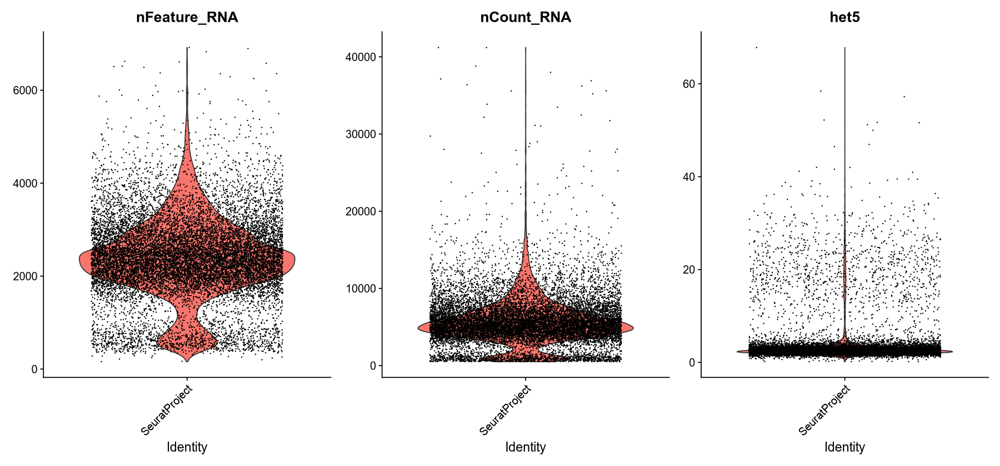

In [9]:
fig.size(7, 15)
lapply(names(objs), function(x){
    VlnPlot(objs[[x]], features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3) + ggtitle(x)
})

In [18]:
hemi.list = c(
    adr.list$het1,
    adr.list$het2,
    objs$het3,
    objs$het4,
    objs$het5
)

In [19]:
hemi.list[[1]]

An object of class Seurat 
31280 features across 12856 samples within 1 assay 
Active assay: RNA (31280 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

In [21]:
lapply(hemi.list, dim)

[[1]]
[1] 31280 12856

[[2]]
[1] 31280  6833

[[3]]
[1] 31410 13863

[[4]]
[1] 31410 15135

[[5]]
[1] 31410 14136

In [16]:
objs$het3

An object of class Seurat 
31410 features across 13863 samples within 1 assay 
Active assay: RNA (31410 features, 0 variable features)
 1 layer present: counts

In [10]:
Basic.Seurat.Clustering = function(obj){
    obj = subset(
        obj,
        subset = (
            (nFeature_RNA > 200) & 
            (nFeature_RNA < 7500) & 
            (percent.mt < 20)
        )
    )
    sce = as.SingleCellExperiment(obj)
    sce = scDblFinder(
        sce,
        samples='orig.ident',
        clusters = FALSE
        #BPPARAM= BiocParallel::MulticoreParam(10)
    )
    obj@meta.data$scDblFinder.class = sce$scDblFinder.class
    obj@meta.data$scDblFinder.score = sce$scDblFinder.score
    
    # obj <- NormalizeData(obj)
    # obj <- FindVariableFeatures(obj, 
    #                             selection.method = 'vst', 
    #                             nfeatures = 5000)
    # obj <- ScaleData(obj)
    # obj <- RunPCA(obj)
    # obj <- RunUMAP(obj, dims = 1:20)
    return(obj)
}

In [13]:
objs = lapply(objs, Basic.Seurat.Clustering)

Warning message:
“Layer ‘data’ is empty”
Warning message:
“Layer ‘scale.data’ is empty”
Warning message:
“Layer ‘data’ is empty”
Warning message:
“Layer ‘scale.data’ is empty”
Warning message:
“Layer ‘data’ is empty”
Warning message:
“Layer ‘scale.data’ is empty”


In [14]:
names(objs) = names(files)

In [15]:
dbl.plots = lapply(names(objs), function(lab){
    objs[[lab]]@meta.data %>%
    ggplot(aes(nCount_RNA, scDblFinder.score, color = scDblFinder.class)) + 
        geom_point(alpha = 0.1,size=0.3) +
        guides(colour = guide_legend(override.aes = list(size=2, alpha = 1))) +
        theme_classic() +
        ggtitle(lab)
})

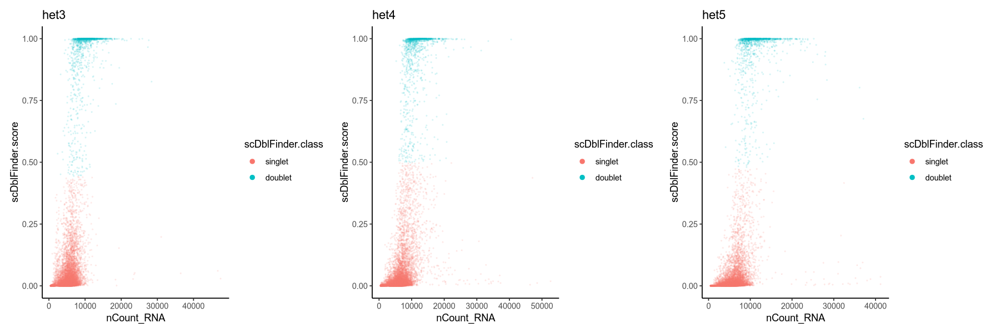

In [17]:
fig.size(5,15)
patchwork::wrap_plots(dbl.plots, ncol = 3)

In [18]:
lapply(objs, function(x){prop.table(table(x$scDblFinder.class))})

$het3

   singlet    doublet 
0.90919632 0.09080368 

$het4

   singlet    doublet 
0.91563531 0.08436469 

$het5

   singlet    doublet 
0.90545508 0.09454492 


In [19]:
objs = lapply(objs, function(obj){
    subset(
        obj,
        subset = (
            scDblFinder.class == 'singlet'
        )
    )
})

In [23]:
objs = lapply(names(objs),
    function(lab){
        objs[[lab]]@meta.data$orig.ident = lab
        return (objs[[lab]])
    }
    
)

In [25]:
names(objs) = names(files)

In [26]:
objs

$het3
An object of class Seurat 
31410 features across 12546 samples within 1 assay 
Active assay: RNA (31410 features, 0 variable features)
 1 layer present: counts

$het4
An object of class Seurat 
31410 features across 13317 samples within 1 assay 
Active assay: RNA (31410 features, 0 variable features)
 1 layer present: counts

$het5
An object of class Seurat 
31410 features across 12316 samples within 1 assay 
Active assay: RNA (31410 features, 0 variable features)
 1 layer present: counts


In [27]:
hemi.list = c(
    adr.list$het1,
    adr.list$het2,
    objs$het3,
    objs$het4,
    objs$het5
)

In [28]:
hemi.list

[[1]]
An object of class Seurat 
31280 features across 12856 samples within 1 assay 
Active assay: RNA (31280 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

[[2]]
An object of class Seurat 
31280 features across 6833 samples within 1 assay 
Active assay: RNA (31280 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

[[3]]
An object of class Seurat 
31410 features across 12546 samples within 1 assay 
Active assay: RNA (31410 features, 0 variable features)
 1 layer present: counts

[[4]]
An object of class Seurat 
31410 features across 13317 samples within 1 assay 
Active assay: RNA (31410 features, 0 variable features)
 1 layer present: counts

[[5]]
An object of class Seurat 
31410 features across 12316 samples within 1 assay 
Active assay: RNA (31410 features, 0 variable features)
 1 layer present: counts


In [31]:
hemi.list <- lapply(X = hemi.list, FUN = function(x) {
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 5000)
})


Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts



In [32]:
hemi.list

[[1]]
An object of class Seurat 
31280 features across 12856 samples within 1 assay 
Active assay: RNA (31280 features, 5000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

[[2]]
An object of class Seurat 
31280 features across 6833 samples within 1 assay 
Active assay: RNA (31280 features, 5000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

[[3]]
An object of class Seurat 
31410 features across 12546 samples within 1 assay 
Active assay: RNA (31410 features, 5000 variable features)
 2 layers present: counts, data

[[4]]
An object of class Seurat 
31410 features across 13317 samples within 1 assay 
Active assay: RNA (31410 features, 5000 variable features)
 2 layers present: counts, data

[[5]]
An object of class Seurat 
31410 features across 12316 samples within 1 assay 
Active assay: RNA (31410 features, 5000 variable features)
 2 layers present: counts, da

In [33]:
features <- SelectIntegrationFeatures(object.list = hemi.list)
hemi.list <- lapply(X = hemi.list, FUN = function(x) {
    x <- ScaleData(x, features = features, verbose = FALSE)
    x <- RunPCA(x, features = features, verbose = FALSE)
})

Warning message:
“Number of dimensions changing from 30 to 50”
Warning message:
“Number of dimensions changing from 30 to 50”


In [35]:
immune.anchors <- FindIntegrationAnchors(
    object.list = hemi.list, 
    anchor.features = features, 
    reduction = "rpca"
)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Scaling features for provided objects

Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 4026 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 2804 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1626 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 4947 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 2941 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 5215 anchor

In [36]:
immune.combined <- IntegrateData(anchorset = immune.anchors)

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 3 5

Extracting anchors for merged samples

Finding integration vectors

Warning message:
“Different cells in new layer data than already exists for scale.data”
Finding integration vector weights

Integrating data

Merging dataset 1 2 into 3 5 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data



In [37]:
DefaultAssay(immune.combined) <- "integrated"

# Run the standard workflow for visualization and clustering
immune.combined <- ScaleData(immune.combined, verbose = FALSE)
immune.combined <- RunPCA(immune.combined, npcs = 30, verbose = FALSE)
immune.combined <- RunUMAP(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindNeighbors(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindClusters(immune.combined, resolution = 0.5)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
09:54:36 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

09:54:36 Read 57868 rows and found 30 numeric columns

09:54:36 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

09:54:36 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:54:40 Writing NN index file to 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 57868
Number of edges: 1741697

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8820
Number of communities: 16
Elapsed time: 14 seconds


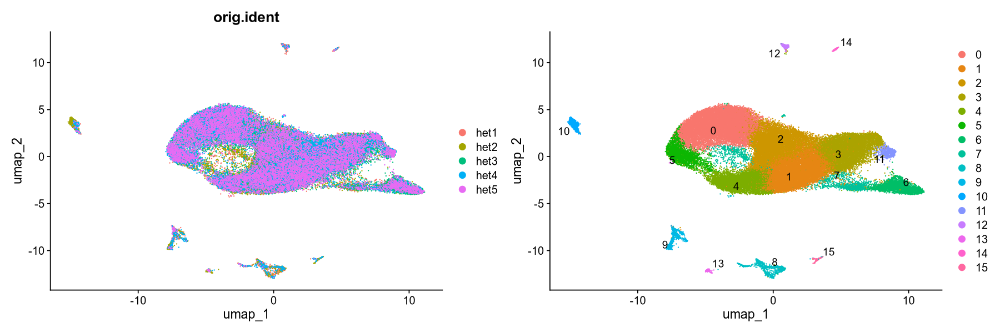

In [38]:
fig.size(5,15)
p1 <- DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident")
p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
p1 + p2

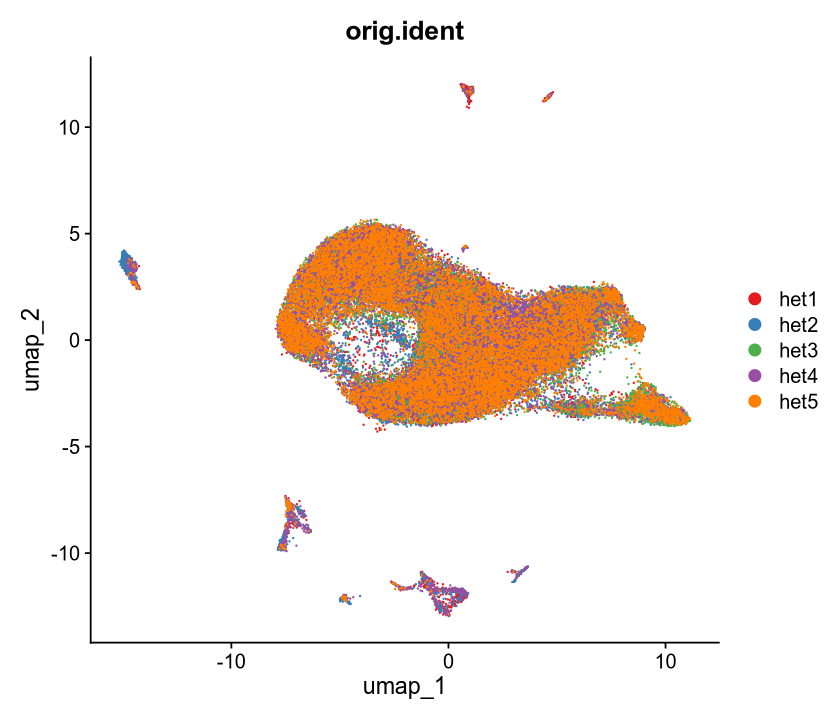

In [40]:
palette_name <- "Set1"
num_colors <- 5

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)
fig.size(6,7)
# Plot with the selected palette
DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident") +
  scale_color_manual(values = colors)

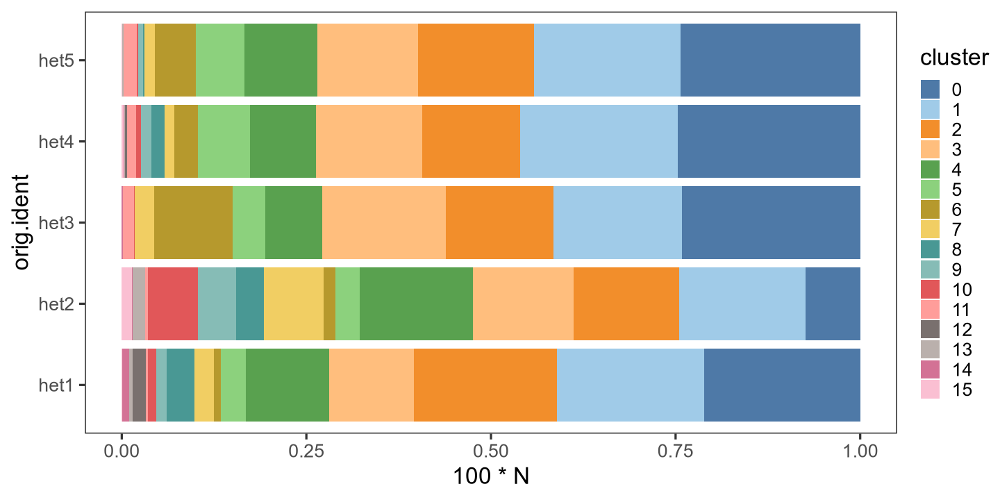

In [41]:
fig.size(6,12)
immune.combined@meta.data %>%
    with(prop.table(table( orig.ident, seurat_clusters ), 1)) %>%
    data.table() %>%
    mutate(cluster = factor(seurat_clusters, (0:19))) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau('Tableau 20') +
    coord_flip() +
    theme_test(base_size = 20)

In [43]:
saveRDS(
    immune.combined,
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.rds'
        )
)

In [44]:
annotations.df = openxlsx::read.xlsx(
    '../Figure5_20230830_No_6-50_Organoids_seurat_annotation_1.xlsx')

In [46]:
annotations.df

,Cluster_Number,Annotation,Gene
,<dbl>,<chr>,<chr>
1,0,G1 phase Sympathoblasts,Cartpt
2,1,S phase Sympathoblasts 1,Hist1h1b
3,2,Synaptic signaling,Tsix
4,3,G2-M phase Sympathoblasts,Cdc20
5,4,G1-S phase Sympathoblasts,Mcm3
6,5,Neurite outgrowth,Klc1
7,6,Chromaffin,Npy
8,7,B cells,Cd79a
9,8,M phase Sympathoblasts,Aspm


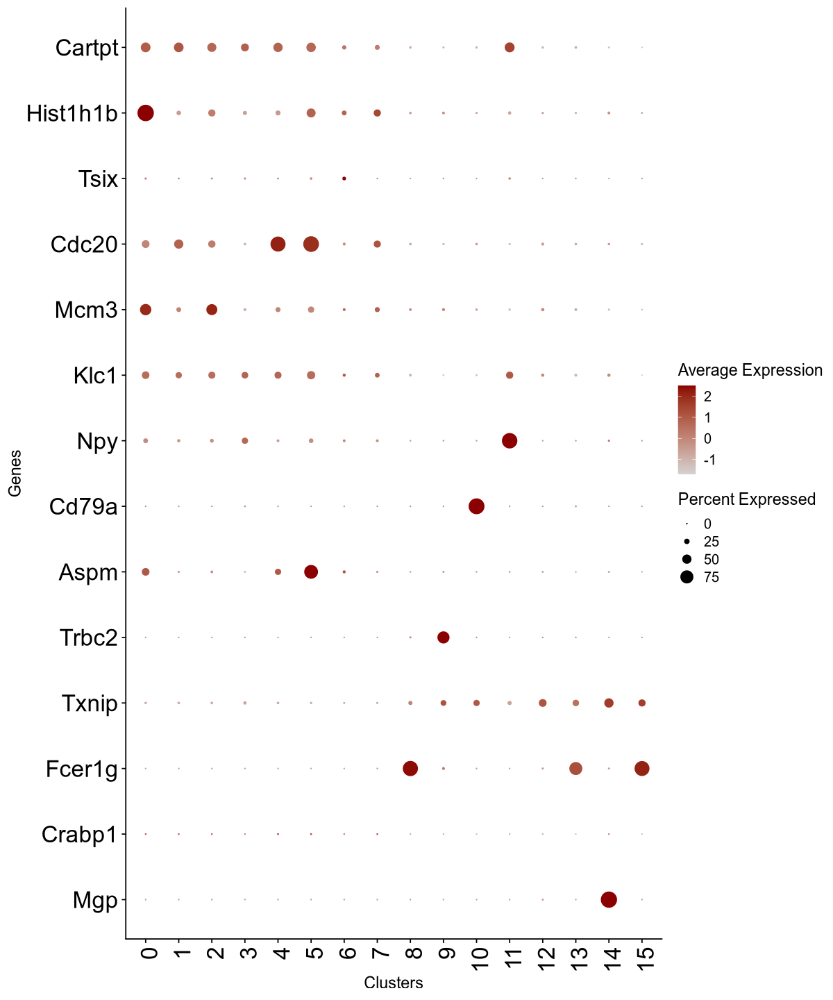

In [45]:
options(repr.plot.height=12, repr.plot.width=10, res=200)
pdot = DotPlot(
        immune.combined, 
        assay='RNA',
        features = unique(annotations.df$Gene) %>% stringr::str_to_title() %>% rev,  
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(
        axis.text.x = element_text(size=20,angle = 90, hjust = 1,vjust = 0.7),
        axis.text.y = element_text(size=20)
       ) +
        xlab('Genes')+
        ylab('Clusters')
pdot

In [49]:
immune.combined = JoinLayers(immune.combined)

In [50]:
DefaultAssay(immune.combined) = "RNA"
all_markers_RNA =  FindAllMarkers(
    immune.combined, 
    min.pct =  0.25, 
    min.diff.pct = 0.25
)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15



In [53]:
saveRDS(all_markers_RNA,'new_5_hemi_samples_DE.rds')

In [51]:
up_down_20 = all_markers_RNA  %>% mutate(sign_up = sign(avg_log2FC)) %>% 
    group_by(cluster, sign_up) %>% slice_max(n = 10, order_by = abs(avg_log2FC)) 

In [52]:
library(gridExtra)


Attaching package: ‘gridExtra’


The following object is masked from ‘package:Biobase’:

    combine


The following object is masked from ‘package:BiocGenerics’:

    combine


The following object is masked from ‘package:dplyr’:

    combine




In [54]:
plot_list = list()
i = 1
for(cluster_id in unique(up_down_20$cluster)){
     plot_list[[i]] = up_down_20 %>% filter(cluster == cluster_id) %>% 
        arrange(avg_log2FC) %>% ggplot(aes(x = reorder(gene,avg_log2FC),y=avg_log2FC)) +
        geom_bar(stat='identity') +
        coord_flip() +
        theme_classic() +
        theme(axis.text.y = element_text(size = 15),
              plot.title = element_text(hjust = 0.5)) + ggtitle(paste("Cluster",cluster_id))
    i = i + 1
}

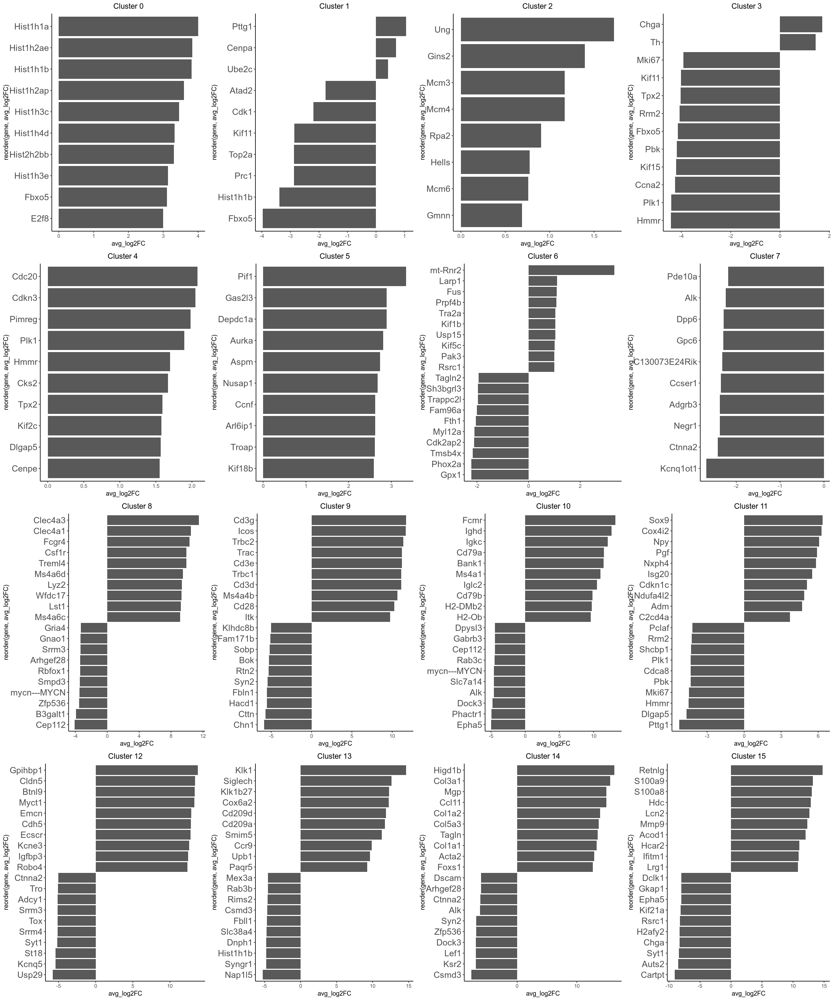

In [55]:
fig.size(24,20)
do.call("grid.arrange", c(plot_list, ncol = 4)) 


NOTE: FeaturePlot_scCustom uses a specified `na_cutoff` when plotting to
color cells with no expression as background color separate from color scale.
Please ensure `na_cutoff` value is appropriate for feature being plotted.
Default setting is appropriate for use when plotting from 'RNA' assay.
When `na_cutoff` not appropriate (e.g., module scores) set to NULL to
plot all cells in gradient color palette.

-----This message will be shown once per session.-----


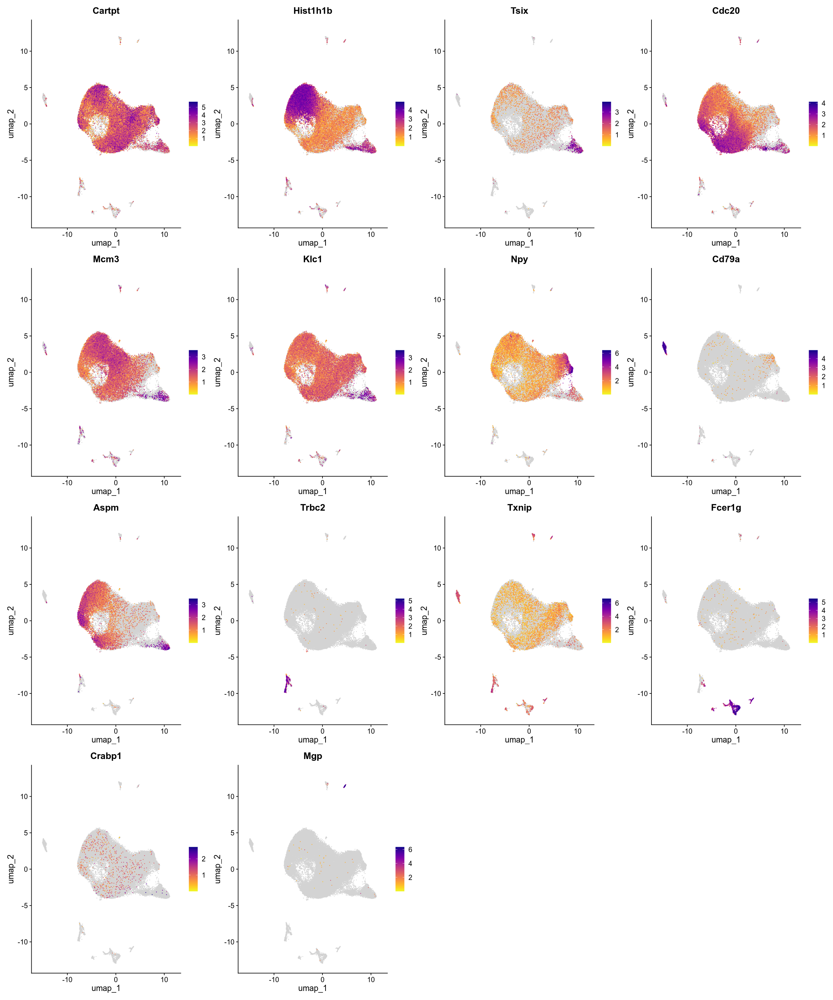

In [56]:
FeaturePlot_scCustom(
    immune.combined, 
    reduction = "umap", 
    features = annotations.df$Gene)

In [64]:
annotations.df = openxlsx::read.xlsx(
    './20240801_Annotations_5-Hemizygous_Samples.xlsx')

In [65]:
annotations.df

,Cluster.number,Annotations
,<dbl>,<chr>
1,0,S phase Sympathoblasts
2,1,Sympathoblasts
3,2,Sympathoblasts
4,3,Chromaffin-Sympathoblasts
5,4,M phase Sympathoblasts
6,5,G2M phase Sympathoblasts
7,6,Sympathoblasts
8,7,Sympathoblasts
9,8,Myeloid cells


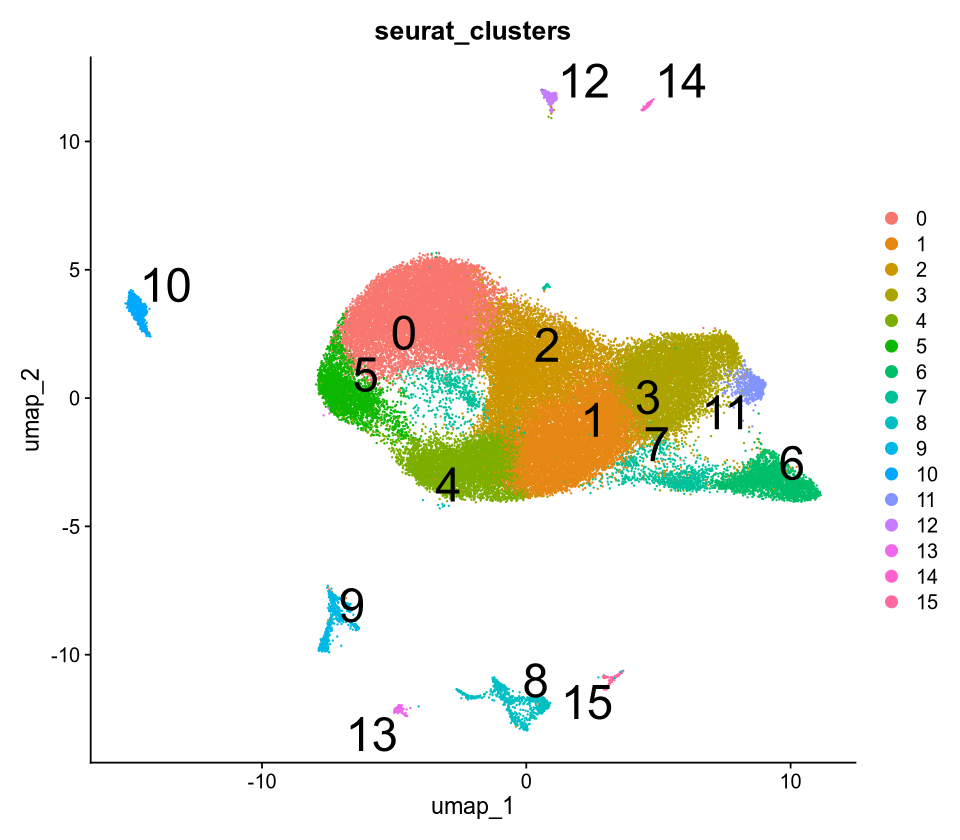

In [66]:
fig.size(7,8)
DimPlot(immune.combined, reduction = "umap", group.by='seurat_clusters',label = TRUE,label.size = 10,
    repel = TRUE)

In [67]:
annot = annotations.df$Annotation
immune.combined@meta.data$annot = annot[ immune.combined$seurat_clusters ]
Idents(immune.combined) = "annot"

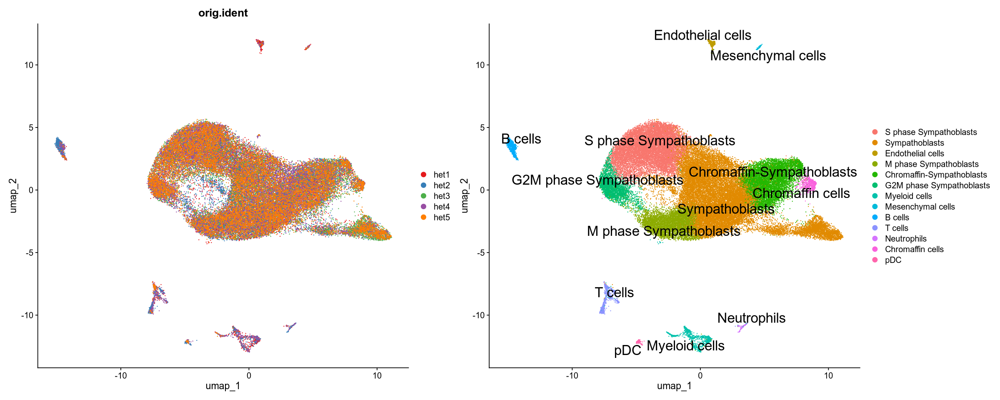

In [68]:
fig.size(8,20)

palette_name <- "Set1"
num_colors <- 5

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE, label.size = 7,
    repel = TRUE)
p1 + p2

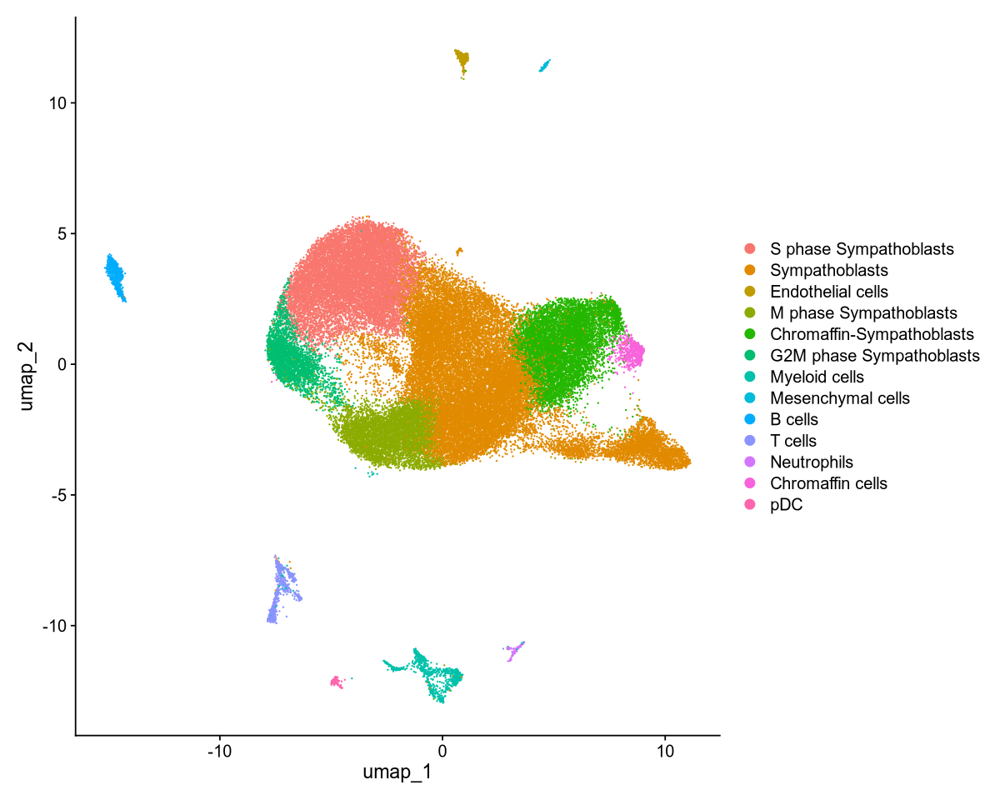

In [71]:
fig.size(8, 10)

p = DimPlot(immune.combined, reduction = "umap", label = FALSE,
    repel = TRUE)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240801_Annotations_5-Hemizygous_unlabeled.pdf'),
    plot =p, 
    height = 9,
    width = 15,
    create.dir=TRUE
      )
p

In [72]:
signature.df = openxlsx::read.xlsx(
    '../spread_sheet/Figure5_20240214_No_6-50_Organoids_survival_signatures.xlsx'
)

In [82]:
dotplot.sig.df = openxlsx::read.xlsx(
    '20240805_Figure1C_Dotplot_5-Hemizygous_Samples.xlsx'
)

In [84]:
dotplot.sig.df %>% head

,Gene,Annotation
,<chr>,<chr>
1,MYCN,Sympathoblasts
2,Stmn1,S phase Sympathoblasts
3,Isl1,G2M phase Sympathoblasts
4,Cdc20,M phase Sympathoblasts
5,Nefl,Chromaffin-Sympathoblasts
6,Phox2b,Chromaffin cells


In [92]:
immune.combined$annot = factor(
    immune.combined$annot, levels=na.omit(dotplot.sig.df$Annotation)) 

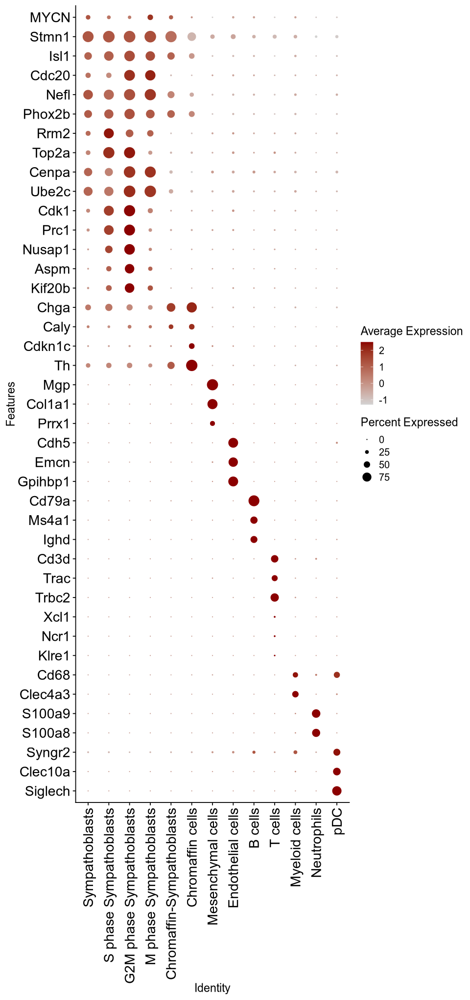

In [103]:
fig.size(17,8)
longdotplot = DotPlot(immune.combined, 
        assay='RNA',
        features = dotplot.sig.df$Gene %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(
             axis.text.x = element_text(
                 angle = 90, hjust=1, vjust=0.5,
             size=17),
             axis.text.y = element_text(
             size=17)
         )
longdotplot

In [105]:

ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240805_Figure1C_Dotplot_5-Hemizygous_Samples.pdf'),
    plot =longdotplot, 
    height = 17,
    width = 8,
    create.dir=TRUE
      )


In [94]:
saveRDS(
    immune.combined,
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.rds'
        )
)

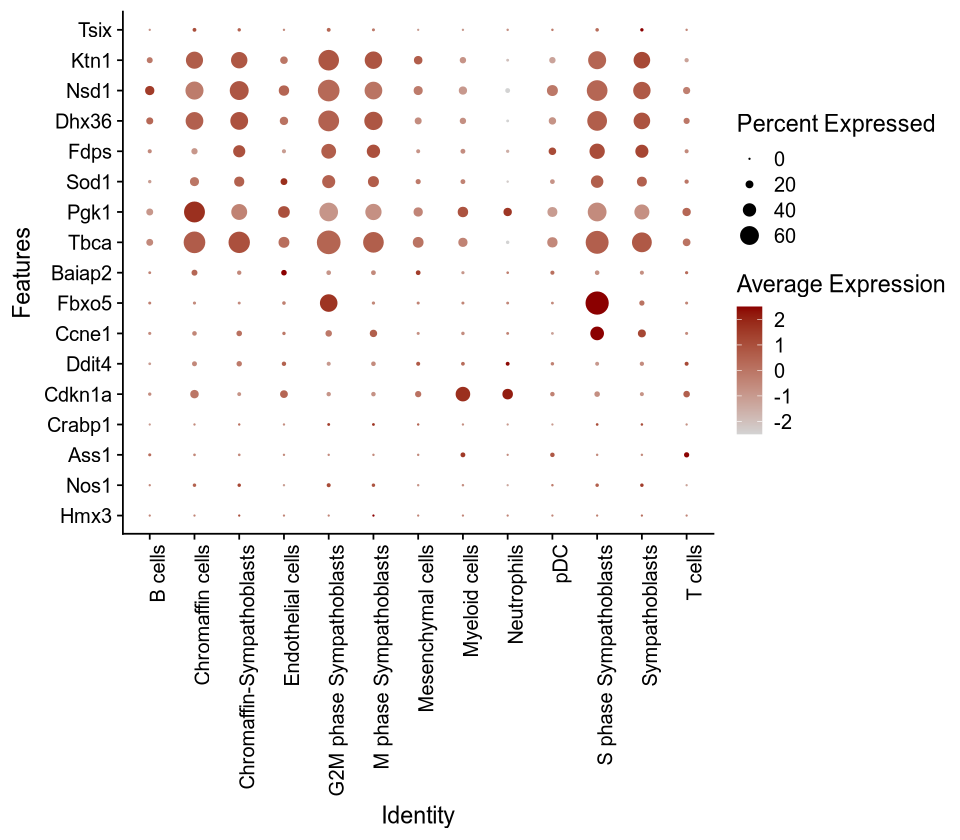

In [73]:
fig.size(7,8)
DotPlot(immune.combined, 
        assay='RNA',
        features = signature.df$Mouse.Gene %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [ ]:
fig.size(7,8)
DotPlot(immune.combined, 
        assay='RNA',
        features = signature.df$Mouse.Gene %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

## CellCycle regression

In [131]:
cc.genes.mm = readRDS('~/cc.genes.mm.rds')

In [132]:
s.genes = cc.genes.mm$s.genes
g2m.genes = cc.genes.mm$g2m.genes

In [76]:
combined <- CellCycleScoring(immune.combined, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

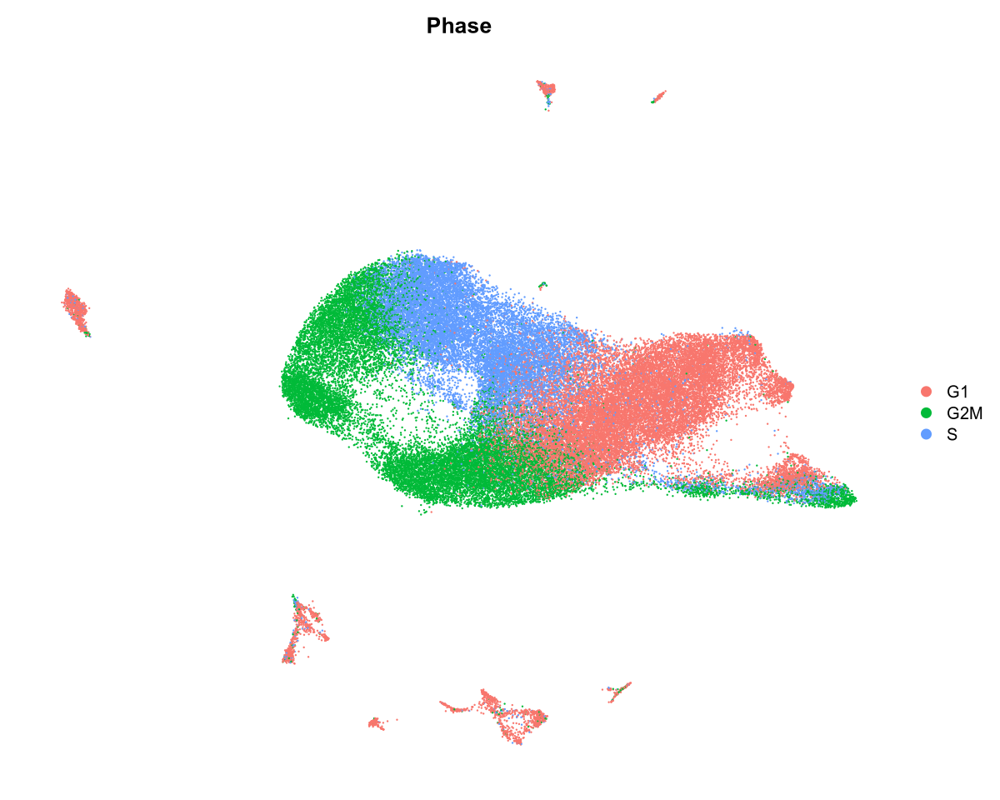

In [77]:
fig.size(8,10)
p1 = DimPlot(combined, group.by = "Phase") + NoAxes()
p1

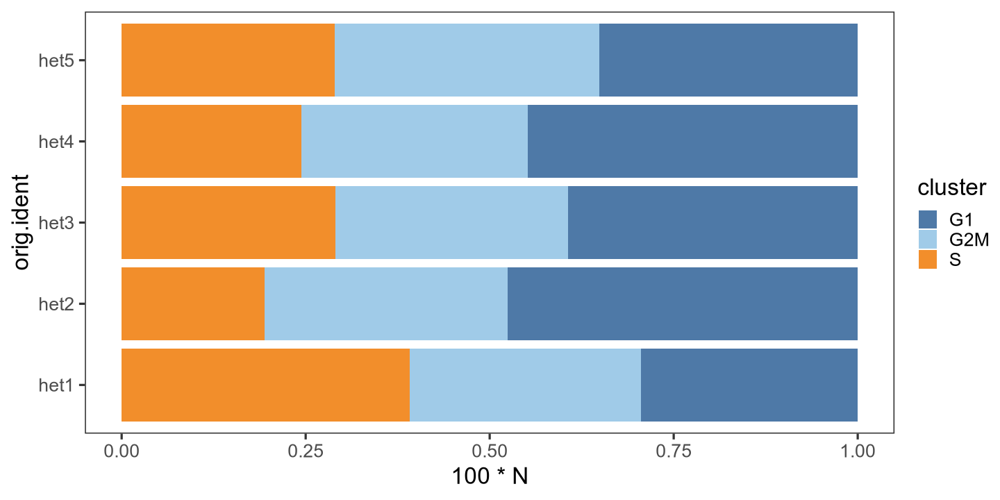

In [80]:
fig.size(6,12)
combined@meta.data %>%
    with(prop.table(table( orig.ident, Phase ), 1)) %>%
    data.table() %>%
    mutate(cluster = Phase) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau('Tableau 20') +
    coord_flip() +
    theme_test(base_size = 20)

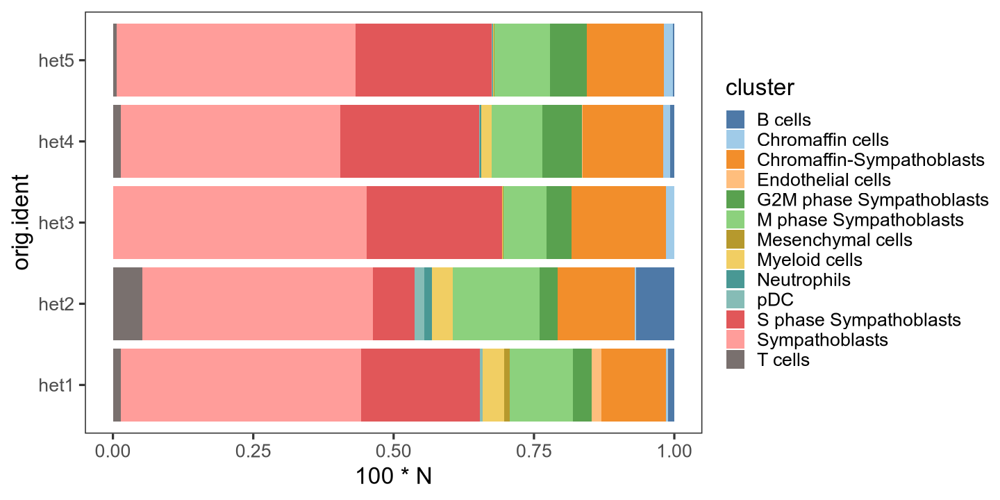

In [81]:
fig.size(6,12)
cellfraction combined@meta.data %>%
    with(prop.table(table( orig.ident, annot ), 1)) %>%
    data.table() %>%
    mutate(cluster = annot) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau('Tableau 20') +
    coord_flip() +
    theme_test(base_size = 20)

## Integrate with Homozygous 

In [9]:
homo = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_homo.rds'
        )
)

In [11]:
homo@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,integrated_snn_res.0.5,seurat_clusters,integrated_snn_res.0.3,annot,adrn_score1,UMAP_1,UMAP_2,annot.rename,S.Score,G2M.Score,Phase,old.ident
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<fct>
homo1_tumor_AAACCCAAGAGGATCC-1,homo1,5383,2171,3.152207,6,6,15,T cells,-0.3471324,4.066091205,11.0850522,T cells,0.0467175,0.6548478,G2M,T cells
homo1_tumor_AAACCCAAGCATGATA-1,homo1,6190,2942,6.464957,4,4,18,Chromaffin-Sympathoblasts,0.9163484,7.812572385,-0.9984247,Adrenergic,-0.3993980,-0.4250588,G1,Chromaffin-Sympathoblasts
homo1_tumor_AAACCCAAGTTCCGGC-1,homo1,2727,1611,2.731411,15,15,22,Endothelial cells,-0.2210504,1.648098554,-12.9656871,Endothelial,-0.1994702,-0.3523622,G1,Endothelial cells
homo1_tumor_AAACCCACAGTCCGTG-1,homo1,6752,2948,4.288632,1,1,5,Sympathoblasts,0.5585668,0.008969511,0.6955534,Adrenergic,-0.1999299,0.2207445,G2M,Sympathoblasts
homo1_tumor_AAACCCACATCAGCAT-1,homo1,8921,3615,4.265615,2,2,9,S phase Sympathoblasts,0.4782346,-4.005131338,-5.1730831,Adrenergic,0.5106746,0.4795225,S,S phase Sympathoblasts
homo1_tumor_AAACCCAGTTTCGATG-1,homo1,10225,3919,6.117974,1,1,13,Sympathoblasts,0.5820631,3.072592880,-0.5764552,Adrenergic,-0.2845918,-0.2628730,G1,Sympathoblasts


In [248]:
library(scales)

In [6]:
hemi = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.rds'
        )
)

In [12]:
hemi@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,integrated_snn_res.0.5,seurat_clusters,integrated_snn_res.0.3,annot,adrn_score1,UMAP_1,UMAP_2,annot.rename,scDblFinder.class,scDblFinder.score
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
het1_tumor_AAACCCAAGCTTTCCC-1_1,het1,4684,2393,3.810926,0,0,9,S phase Sympathoblasts,0.22473008,-4.732944,-5.9933827,Adrenergic,NA,NA
het1_tumor_AAACCCAAGGCGTTAG-1_1,het1,4041,2175,4.574907,1,1,1,Sympathoblasts,0.42346147,2.654133,-1.6378979,Adrenergic,NA,NA
het1_tumor_AAACCCACAATCTCGA-1_1,het1,2337,1365,2.419355,12,12,22,Endothelial cells,0.09742892,2.033597,-13.0404752,Endothelial,NA,NA
het1_tumor_AAACCCACACCAAAGG-1_1,het1,5719,2817,4.676617,0,0,9,S phase Sympathoblasts,0.51437384,-4.856750,-4.9916637,Adrenergic,NA,NA
het1_tumor_AAACCCAGTCGAACAG-1_1,het1,4549,2283,5.868777,2,2,6,Sympathoblasts,0.22951915,1.441997,-4.0084196,Adrenergic,NA,NA
het1_tumor_AAACCCATCACATCAG-1_1,het1,3677,2058,4.598698,4,4,12,M phase Sympathoblasts,0.11545802,-1.541427,0.8861161,Adrenergic,NA,NA


In [144]:
unique(sub("-.*$", "", row.names(hemi@meta.data))) %>% head

[1] "het1_tumor_AAACCCAAGCTTTCCC" "het1_tumor_AAACCCAAGGCGTTAG"
[3] "het1_tumor_AAACCCACAATCTCGA" "het1_tumor_AAACCCACACCAAAGG"
[5] "het1_tumor_AAACCCAGTCGAACAG" "het1_tumor_AAACCCATCACATCAG"

In [145]:
 unique(sub("_[^_]+$", "", row.names(hemi@meta.data))) %>% head

[1] "het1_tumor_AAACCCAAGCTTTCCC-1" "het1_tumor_AAACCCAAGGCGTTAG-1"
[3] "het1_tumor_AAACCCACAATCTCGA-1" "het1_tumor_AAACCCACACCAAAGG-1"
[5] "het1_tumor_AAACCCAGTCGAACAG-1" "het1_tumor_AAACCCATCACATCAG-1"

In [7]:
#hemi = immune.combined

In [13]:
color.list = ggthemes::tableau_color_pal('Tableau 20')(20)[1:15]
#color.list = hue_pal()(15)
names(color.list) = homo$annot %>% unique

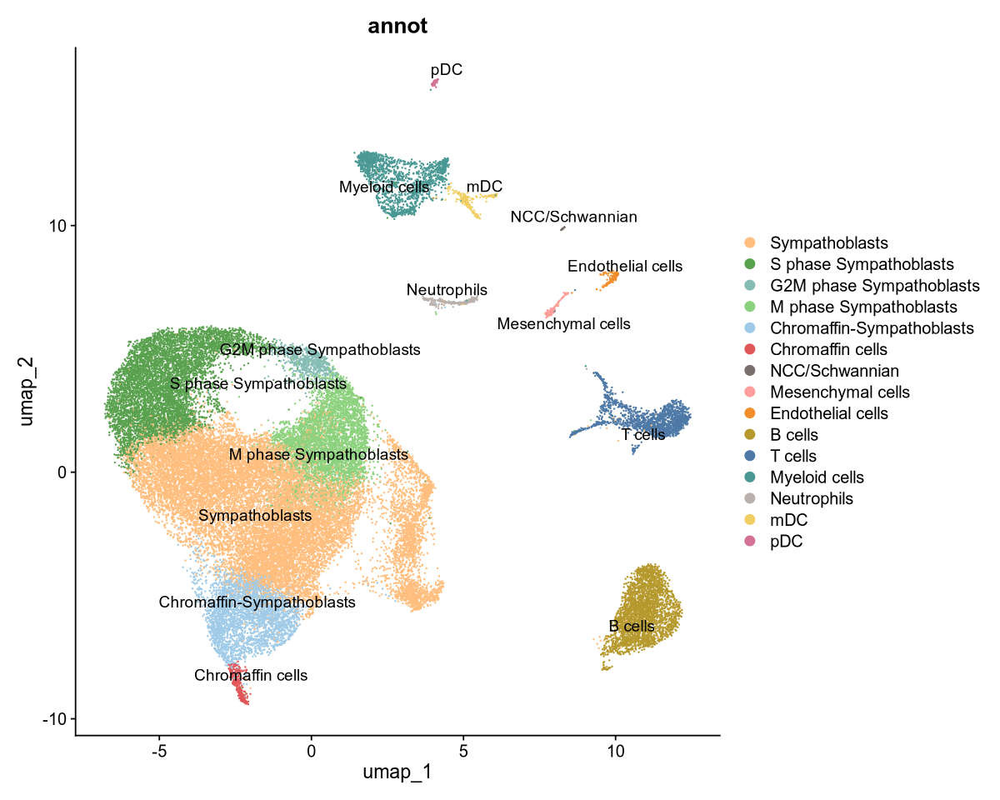

In [14]:
fig.size(8, 10)
homo_dim = DimPlot(homo, group.by = 'annot',
        reduction = "umap", label = TRUE,
    repel = TRUE) + 
    scale_color_manual(values = color.list)
homo_dim

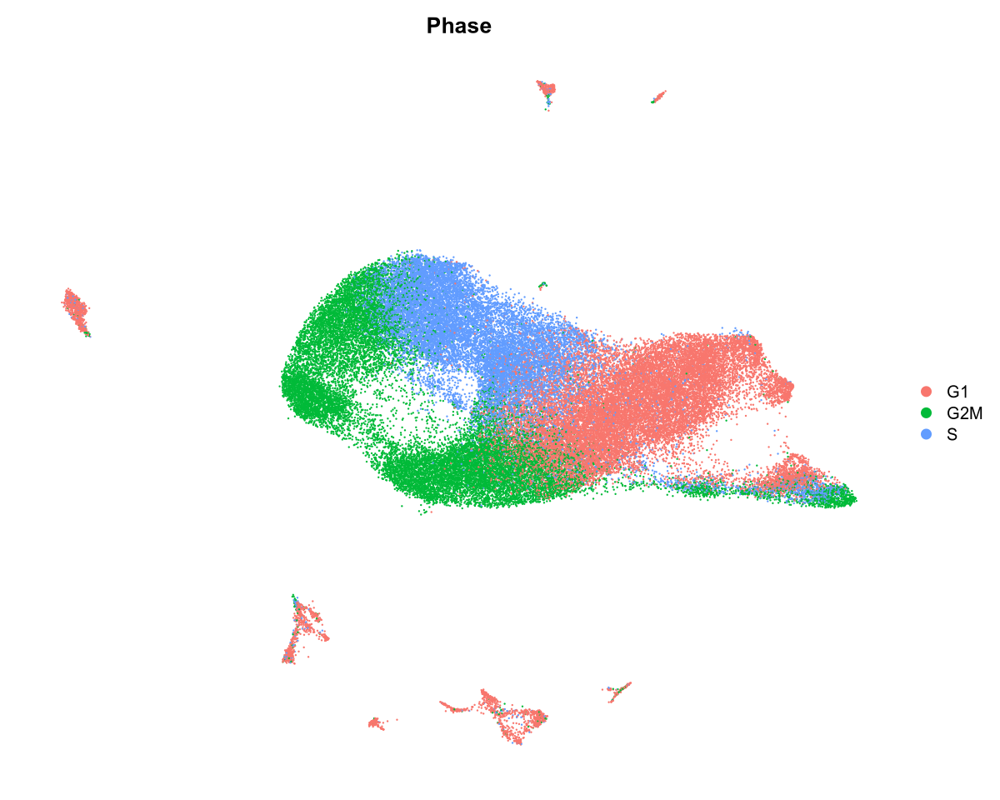

In [271]:
fig.size(8,10)
p1 = DimPlot(hemi, group.by = "Phase") + NoAxes()
p1

ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/5_sample_hemi_phase.pdf'),
    plot= p1, 
    height = 8,
    width = 10,
    create.dir=TRUE
      )

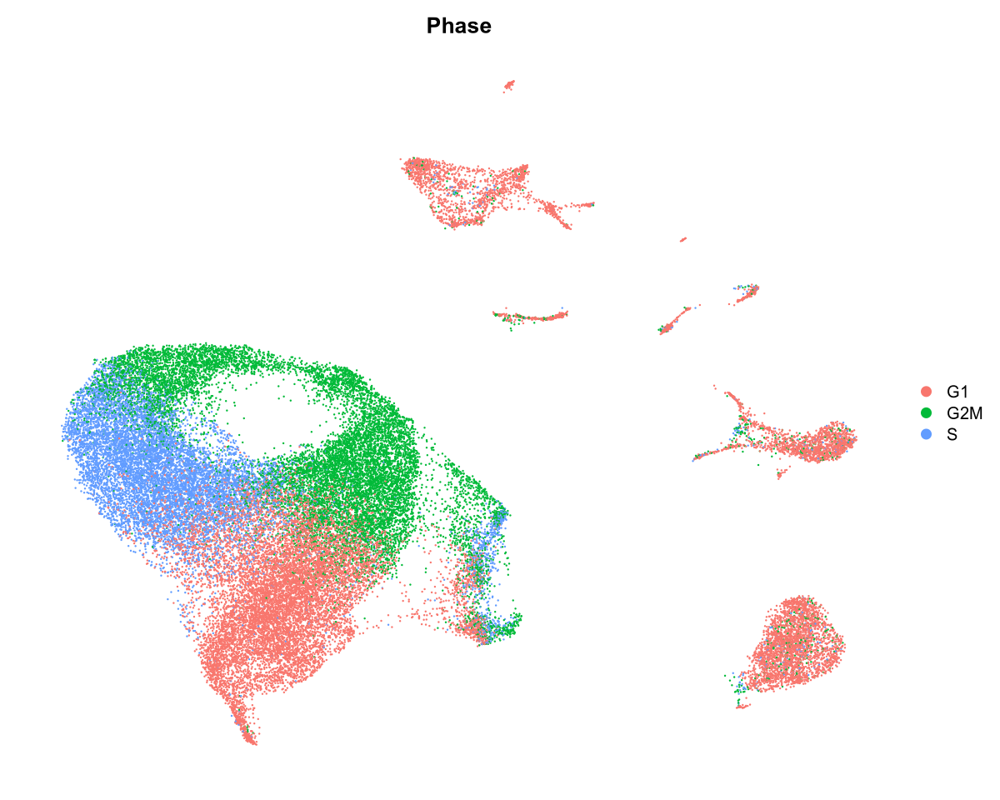

In [272]:
fig.size(8,10)
p1 = DimPlot(homo, group.by = "Phase") + NoAxes()
p1

ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/5_sample_homo_phase.pdf'),
    plot= p1, 
    height = 8,
    width = 10,
    create.dir=TRUE
      )

In [256]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/5_sample_homozygous.pdf'),
    plot= homo_dim, 
    height = 8,
    width = 10,
    create.dir=TRUE
      )

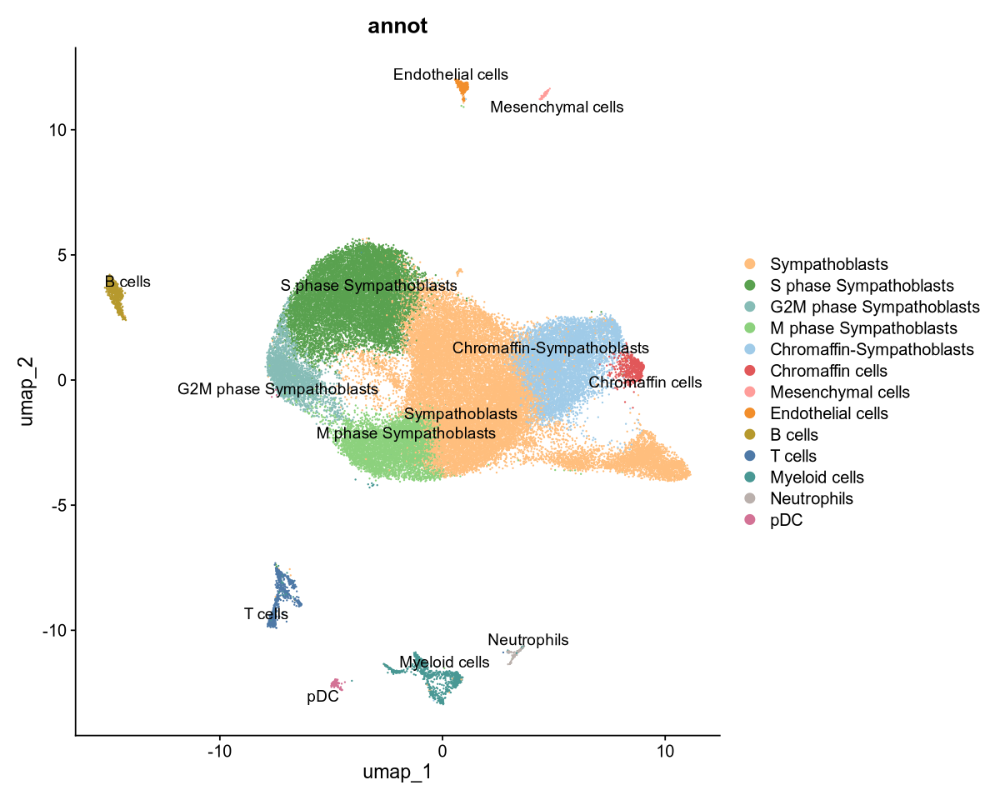

In [15]:
fig.size(8, 10)
hemi_dim = DimPlot(hemi, group.by = 'annot',
        reduction = "umap", label = TRUE,
    repel = TRUE) + 
    scale_color_manual(values = color.list)
hemi_dim

In [260]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/5_sample_hemizygous.pdf'),
    plot= hemi_dim, 
    height = 8,
    width = 10,
    create.dir=TRUE
      )

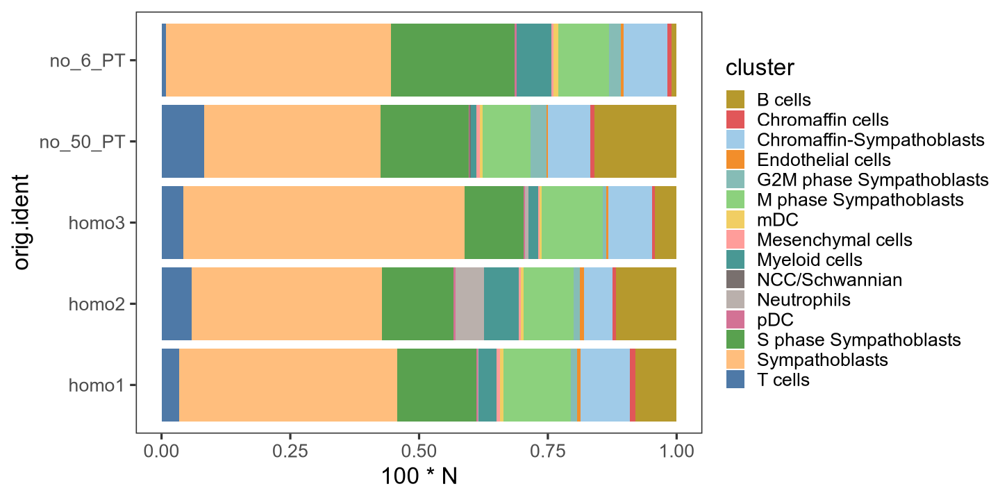

In [268]:
fig.size(6,12)
homo_bar = homo@meta.data %>%
    with(prop.table(table( orig.ident, annot ), 1)) %>%
    data.table() %>%
    mutate(cluster = annot) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    scale_fill_manual(values = color.list) +
    coord_flip() +
    theme_test(base_size = 20)
homo_bar

In [269]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/5_sample_homozygous_bar.pdf'),
    plot= homo_bar, 
    height = 6,
    width = 12,
    create.dir=TRUE
      )

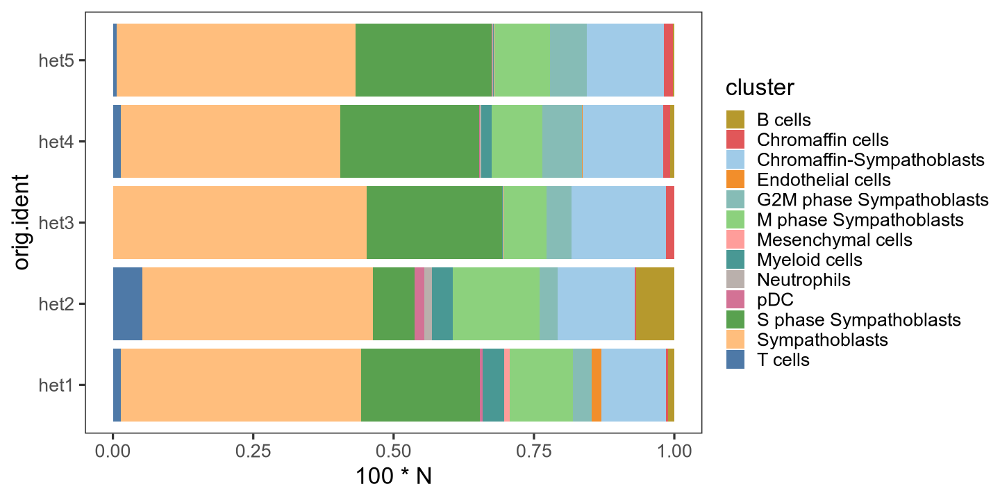

In [265]:
fig.size(6,12)
hemi_bar = hemi@meta.data %>%
    with(prop.table(table( orig.ident, annot ), 1)) %>%
    data.table() %>%
    mutate(cluster = annot) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    scale_fill_manual(values = color.list) +
    coord_flip() +
    theme_test(base_size = 20)

hemi_bar 

In [267]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/5_sample_hemizygous_bar.pdf'),
    plot= hemi_bar, 
    height = 6,
    width = 12,
    create.dir=TRUE
      )

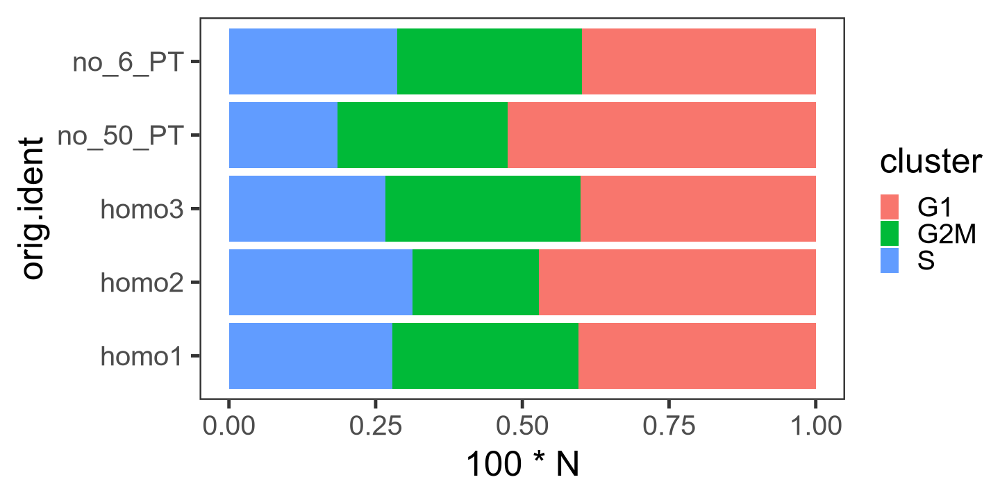

In [276]:
fig.size(6,12)
homo_phase_bar = homo@meta.data %>%
    with(prop.table(table( orig.ident, Phase ), 1)) %>%
    data.table() %>%
    mutate(cluster = Phase) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    #ggthemes::scale_fill_tableau() +
    coord_flip() +
    theme_test(base_size = 30)

homo_phase_bar

In [277]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/5_sample_homozygous_phase_bar.pdf'),
    plot= homo_phase_bar, 
    height = 6,
    width = 12,
    create.dir=TRUE
      )

In [121]:
cc.genes.mm = readRDS('~/cc.genes.mm.rds')
s.genes = cc.genes.mm$s.genes
g2m.genes = cc.genes.mm$g2m.genes
hemi <- CellCycleScoring(hemi, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

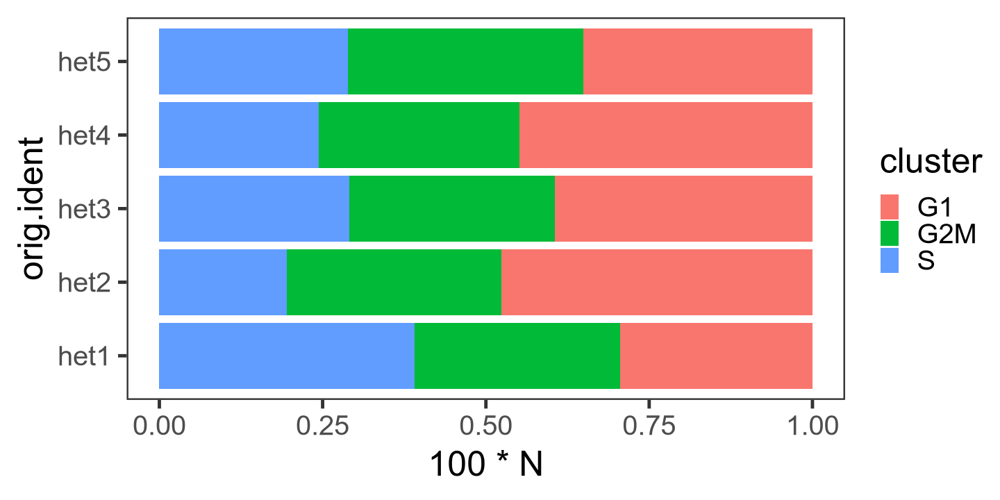

In [278]:
fig.size(6,12)
hemi_phase_bar = hemi@meta.data %>%
    with(prop.table(table( orig.ident, Phase ), 1)) %>%
    data.table() %>%
    mutate(cluster = Phase) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    #ggthemes::scale_fill_tableau() +
    coord_flip() +
    theme_test(base_size = 30)
hemi_phase_bar

In [279]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/5_sample_hemizygous_phase_bar.pdf'),
    plot= hemi_phase_bar, 
    height = 6,
    width = 12,
    create.dir=TRUE
      )

In [ ]:
hemi_phase_bar

In [135]:
hemi_data <- hemi@meta.data %>%
    with(prop.table(table(orig.ident, annot), 1)) %>%
    data.table() %>%
    mutate(dataset = "hemi")
homo_data <- homo@meta.data %>%
    with(prop.table(table(orig.ident, annot), 1)) %>%
    data.table() %>%
    mutate(dataset = "homo")


common_annot <- intersect(hemi_data$annot, homo_data$annot)
hemi_data <- hemi_data %>% filter(annot %in% common_annot)
homo_data <- homo_data %>% filter(annot %in% common_annot)
combined_data <- rbind(hemi_data, homo_data)
comparisons <- common_annot %>%
  lapply(function(x) c("hemi", "homo"))

significance_results <- combined_data %>%
  group_by(annot) %>%
  summarise(p.value = wilcox.test(N[dataset == "hemi"], N[dataset == "homo"])$p.value) %>%
  filter(p.value < 0.1) %>%
  mutate(significance = ifelse(p.value < 0.05, "**", "*"))


y_positions <- combined_data %>%
  filter(annot %in% significance_results$annot) %>%
  group_by(annot) %>%
  summarise(y.position = max(N) + 0.05)

# Merge y_positions into significance_results
significance_results <- significance_results %>%
  left_join(y_positions, by = "annot") %>%
  mutate(dataset = "hemi")  # Create a dummy dataset column for compatibility

# Create comparisons list for ggsignif with only significant annotations
significant_comparisons <- significance_results$annot %>%
  lapply(function(x) list(c("hemi", "homo")))

In [239]:
significance_results

annot,p.value,significance,y.position,dataset
<chr>,<dbl>,<chr>,<dbl>,<chr>
B cells,0.055555556,*,0.2096103,hemi
Chromaffin-Sympathoblasts,0.007936508,**,0.2173840,hemi
G2M phase Sympathoblasts,0.007936508,**,0.1198355,hemi


Warning message:
“Computation failed in `stat_signif()`.
Caused by error in `if (scales$x$map(comp[1]) == data$group[1] | manual) ...`:
! missing value where TRUE/FALSE needed”


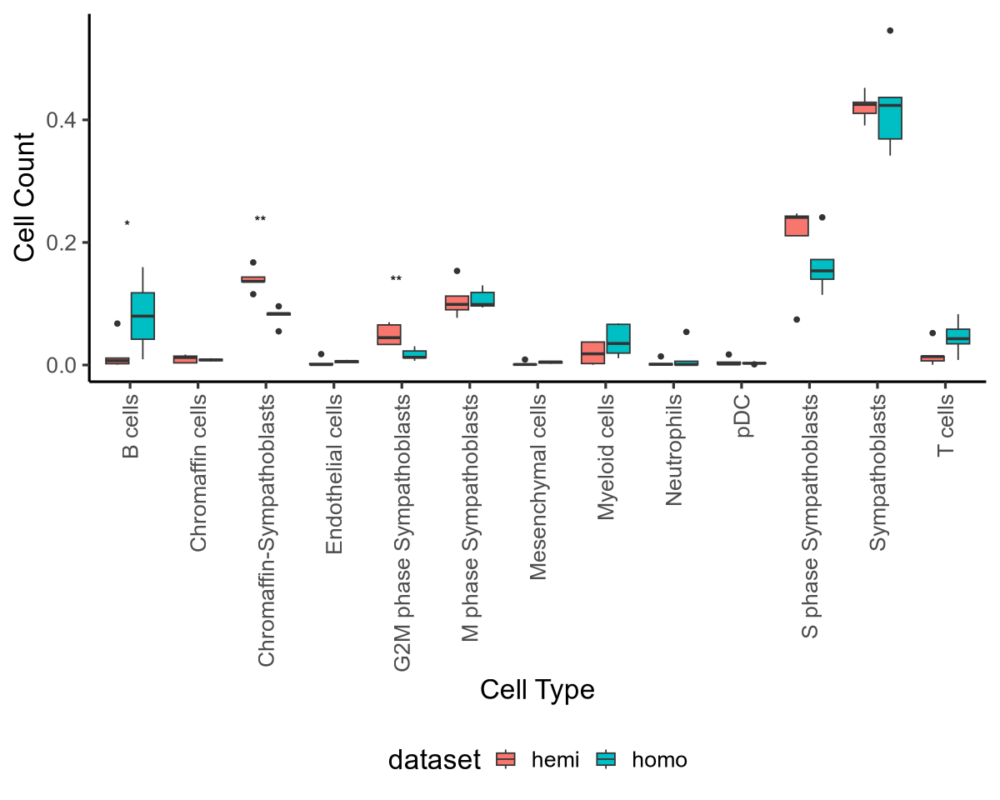

In [240]:
significant_comparisons <- significance_results$annot %>%
  lapply(function(x) c("hemi", "homo"))


fig.size(8,10)
pbox = ggplot(combined_data, aes(x = annot, y = N, fill = dataset)) +
  geom_boxplot() +
  #scale_fill_manual(values = c("hemi" = "blue", "homo" = "red")) +
  theme_classic(base_size = 20) +
  theme(
    legend.position = "bottom",
    axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5)
  ) +
  labs(y = "Cell Count", x = "Cell Type") +
  geom_signif(
    comparisons = significant_comparisons,
    annotations = significance_results$significance,
    map_signif_level = TRUE,
    y_position = significance_results$y.position,
    tip_length = 0.01,
    vjust = 0.5
  ) +
  geom_text(
    data = significance_results,
    aes(x = annot, y = y.position, label = significance),
    vjust = -0.5,
    hjust = 1
  ) 
pbox

In [241]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240805_Figure1C_Honozygous-Hemizygous_boxplot_cell_type_proportion.pdf'),
    plot= pbox, 
    height = 8,
    width = 10,
    create.dir=TRUE
      )


Warning message:
“Computation failed in `stat_signif()`.
Caused by error in `if (scales$x$map(comp[1]) == data$group[1] | manual) ...`:
! missing value where TRUE/FALSE needed”


In [133]:
hemi <- CellCycleScoring(hemi, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

In [136]:
hemi_data <- hemi@meta.data %>%
    with(prop.table(table(orig.ident, Phase), 1)) %>%
    data.table() %>%
    mutate(dataset = "hemi")
homo_data <- homo@meta.data %>%
    with(prop.table(table(orig.ident, Phase), 1)) %>%
    data.table() %>%
    mutate(dataset = "homo")
# common_annot <- intersect(hemi_data$annot, homo_data$annot)
# hemi_data <- hemi_data %>% filter(annot %in% common_annot)
# homo_data <- homo_data %>% filter(annot %in% common_annot)
combined_data <- rbind(hemi_data, homo_data)

comparisons <- common_annot %>%
  lapply(function(x) c("hemi", "homo"))

significance_results <- combined_data %>%
  group_by(Phase) %>%
  summarise(p.value = wilcox.test(N[dataset == "hemi"], N[dataset == "homo"])$p.value) %>%
  filter(p.value < 0.1) %>%
  mutate(significance = ifelse(p.value < 0.05, "**", "*"))


y_positions <- combined_data %>%
  filter(Phase %in% significance_results$Phase) %>%
  group_by(Phase) %>%
  summarise(y.position = max(N) + 0.05)

# Merge y_positions into significance_results
significance_results <- significance_results %>%
  left_join(y_positions, by = "Phase") %>%
  mutate(dataset = "hemi")  # Create a dummy dataset column for compatibility

# Create comparisons list for ggsignif with only significant annotations
significant_comparisons <- significance_results$Phase %>%
  lapply(function(x) list(c("hemi", "homo")))

Warning message:
“There was 1 warning in `summarise()`.
ℹ In argument: `y.position = max(N) + 0.05`.
Caused by warning in `max()`:
! no non-missing arguments to max; returning -Inf”


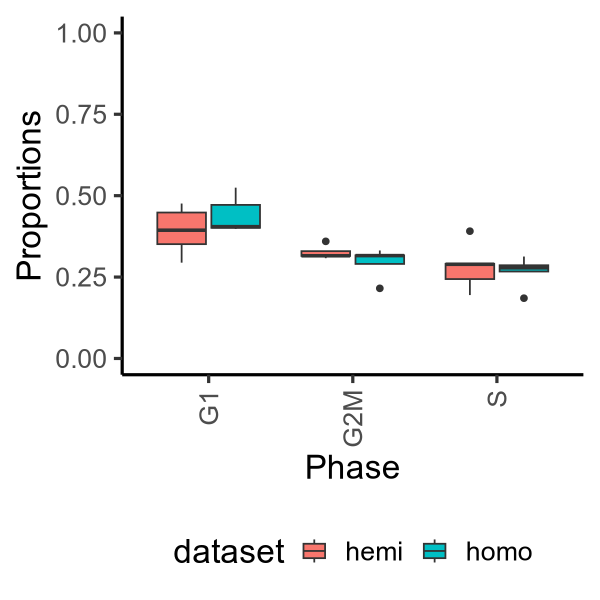

In [138]:
fig.size(5,5)

pbox = ggplot(combined_data, aes(x = Phase, y = N, fill = dataset)) +
  geom_boxplot() +
  #scale_fill_manual(values = c("hemi" = "blue", "homo" = "red")) +
  theme_classic(base_size = 20) +
  theme(
    legend.position = "bottom",
    axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5)
  ) +
  ylim(0,1)+
  labs(y = "Proportions", x = "Phase")
pbox

In [139]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240805_Figure1C_Honozygous-Hemizygous_boxplot_phase_proportion.pdf'),
    plot= pbox, 
    height = 5,
    width = 5,
    create.dir=TRUE
      )

## Integration 

In [16]:
hemi$dataset = "hemi"
homo$dataset = "homo"

In [17]:
data.list = list(homo = homo, hemi = hemi)

In [18]:
features <- SelectIntegrationFeatures(object.list = data.list)

No variable features found for object1 in the object.list. Running FindVariableFeatures ...



In [19]:
immune.anchors <- FindIntegrationAnchors(
    object.list = c(hemi, homo), 
    anchor.features = features, 
    reduction = "rpca"
)

Scaling features for provided objects

Warning message:
“Different features in new layer data than already exists for scale.data”
Computing within dataset neighborhoods

Finding anchors

	Found 3141 anchors



In [20]:
immune.combined <- IntegrateData(anchorset = immune.anchors)

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“Different cells and/or features from existing assay integrated”


In [21]:
DefaultAssay(immune.combined) <- "integrated"

# Run the standard workflow for visualization and clustering
immune.combined <- ScaleData(immune.combined, verbose = FALSE)
immune.combined <- RunPCA(immune.combined, npcs = 30, verbose = FALSE)
immune.combined <- RunUMAP(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindNeighbors(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindClusters(immune.combined, resolution = 0.5)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
22:36:00 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

22:36:00 Read 99298 rows and found 30 numeric columns

22:36:00 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

22:36:00 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:36:07 Writing NN index file to 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 99298
Number of edges: 3184175

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9342
Number of communities: 24
Elapsed time: 34 seconds


1 singletons identified. 23 final clusters.



In [22]:
immune.combined 

An object of class Seurat 
33411 features across 99298 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 2 layers present: data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [24]:
immune.combined@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,integrated_snn_res.0.5,seurat_clusters,integrated_snn_res.0.3,annot,adrn_score1,UMAP_1,UMAP_2,annot.rename,scDblFinder.class,scDblFinder.score,dataset,S.Score,G2M.Score,Phase,old.ident
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>
het1_tumor_AAACCCAAGCTTTCCC-1_1,het1,4684,2393,3.81092574,10,10,9,S phase Sympathoblasts,0.224730081,-4.7329441,-5.9933827,Adrenergic,NA,NA,hemi,NA,NA,NA,NA
het1_tumor_AAACCCAAGGCGTTAG-1_1,het1,4041,2175,4.57490673,3,3,1,Sympathoblasts,0.423461475,2.6541335,-1.6378979,Adrenergic,NA,NA,hemi,NA,NA,NA,NA
het1_tumor_AAACCCACAATCTCGA-1_1,het1,2337,1365,2.41935484,18,18,22,Endothelial cells,0.097428919,2.0335968,-13.0404752,Endothelial,NA,NA,hemi,NA,NA,NA,NA
het1_tumor_AAACCCACACCAAAGG-1_1,het1,5719,2817,4.67661692,10,10,9,S phase Sympathoblasts,0.514373843,-4.8567501,-4.9916637,Adrenergic,NA,NA,hemi,NA,NA,NA,NA
het1_tumor_AAACCCAGTCGAACAG-1_1,het1,4549,2283,5.86877679,3,3,6,Sympathoblasts,0.229519152,1.4419970,-4.0084196,Adrenergic,NA,NA,hemi,NA,NA,NA,NA
het1_tumor_AAACCCATCACATCAG-1_1,het1,3677,2058,4.59869848,3,3,12,M phase Sympathoblasts,0.115458023,-1.5414265,0.8861161,Adrenergic,NA,NA,hemi,NA,NA,NA,NA
het1_tumor_AAACCCATCCAAAGGG-1_1,het1,4741,2468,5.53691275,3,3,11,M phase Sympathoblasts,0.049205747,-1.5034340,0.4954319,Adrenergic,NA,NA,hemi,NA,NA,NA,NA
het1_tumor_AAACCCATCGCTGTCT-1_1,het1,2373,1543,4.93377483,3,3,0,Chromaffin-Sympathoblasts,0.817872231,6.3683619,-2.0903852,Adrenergic,NA,NA,hemi,NA,NA,NA,NA
het1_tumor_AAACCCATCGGCTGAC-1_1,het1,1846,1081,3.59223301,18,18,22,Endothelial cells,-0.161046331,1.7087577,-13.1077016,Endothelial,NA,NA,hemi,NA,NA,NA,NA


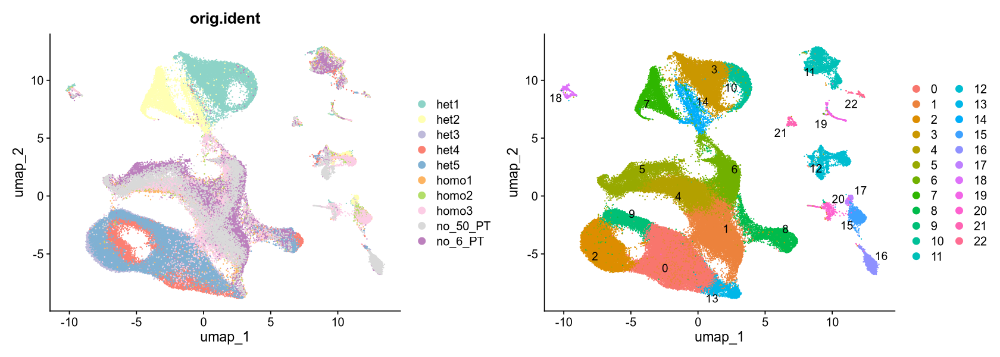

In [124]:
fig.size(5,14)
palette_name <- "Set3"
num_colors <- 10

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
p1 + p2

In [126]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Homozygous-Hemizygous_integrated_umap_orig_ident.pdf'),
    plot =p1, 
    height = 5,
    width = 7,
    create.dir=TRUE
      )

In [127]:
colors

[1] "#8DD3C7" "#FFFFB3" "#BEBADA" "#FB8072" "#80B1D3" "#FDB462" "#B3DE69"
 [8] "#FCCDE5" "#D9D9D9" "#BC80BD"

Warning message in brewer.pal(num_colors, palette_name):
“minimal value for n is 3, returning requested palette with 3 different levels
”


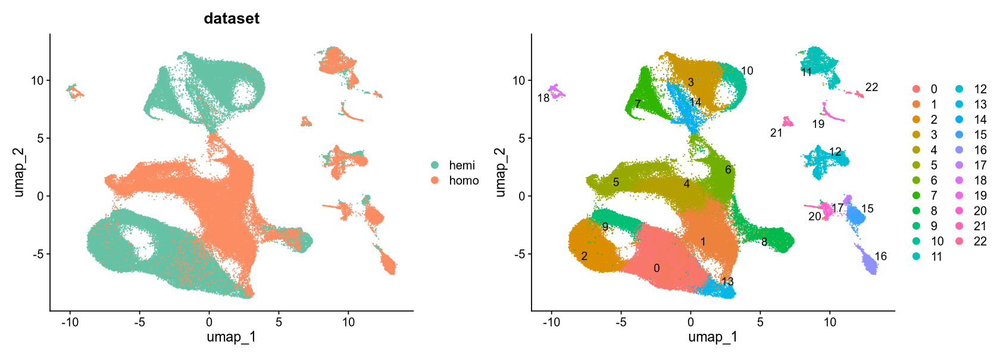

In [128]:
fig.size(5,14)
palette_name <- "Set2"
num_colors <- 2

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "dataset") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
p1 + p2

In [129]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Homozygous-Hemizygous_integrated_umap_genotype.pdf'),
    plot =p1, 
    height = 5,
    width = 7,
    create.dir=TRUE
      )

In [30]:
saveRDS(immune.combined,
        glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_10_hemi_homo_integrated.rds'
    )
)

In [32]:
dotplot.sig.df.homo = openxlsx::read.xlsx(
    '20240805_Figure1C_Dotplot_5-Homozygous_Samples.xlsx',sheet = 'Dotplot'
)

In [31]:
dotplot.sig.df.hemi = openxlsx::read.xlsx(
    '20240805_Figure1C_Dotplot_5-Hemizygous_Samples.xlsx',sheet = 'Dotplot'
)

In [33]:
cellxgene = read.csv(
    'CELLxGENE_gene_expression_080524.csv',
    comment.char = "#"
)

In [37]:
hemi@meta.data$annot %>% levels

[1] "Sympathoblasts"            "S phase Sympathoblasts"   
 [3] "G2M phase Sympathoblasts"  "M phase Sympathoblasts"   
 [5] "Chromaffin-Sympathoblasts" "Chromaffin cells"         
 [7] "Mesenchymal cells"         "Endothelial cells"        
 [9] "B cells"                   "T cells"                  
[11] "Myeloid cells"             "Neutrophils"              
[13] "pDC"

In [38]:
homo@meta.data$annot %>% levels

[1] "Sympathoblasts"            "S phase Sympathoblasts"   
 [3] "G2M phase Sympathoblasts"  "M phase Sympathoblasts"   
 [5] "Chromaffin-Sympathoblasts" "Chromaffin cells"         
 [7] "NCC/Schwannian"            "Mesenchymal cells"        
 [9] "Endothelial cells"         "B cells"                  
[11] "T cells"                   "Myeloid cells"            
[13] "Neutrophils"               "mDC"                      
[15] "pDC"

In [ ]:
ct = c(
    sympathetic neuron, chromaffin cell, Schwann cell, mesenchymal stem cell, endothelial cell, B cell, T cell, natural killer cell, myeloid cell, macrophage, neutrophil, dendritic cell
)

In [50]:
cellxgene %>% filter(Cell.Type != 'aggregated') %>% pull(Cell.Type) %>% unique

[1] "mesenchymal stem cell" "macrophage"            "dendritic cell"       
 [4] "B cell"                "T cell"                "natural killer cell"  
 [7] "neutrophil"            "myeloid cell"          "Schwann cell"         
[10] "chromaffin cell"       "sympathetic neuron"    "endothelial cell"

In [48]:
cellxgene %>%  filter(Cell.Type != 'aggregated') %>%
    group_by(Cell.Type) %>%
    slice_max(n=5, order_by = Expression)

Tissue,Cell.Type,Cell.Count,Tissue.Composition,Gene.Symbol,Expression,Expression..Scaled,Number.of.Cells.Expressing.Genes
<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<int>
adrenal gland,B cell,384,0.27%,CD74,4.776234,0.7153845,382
adrenal gland,B cell,384,0.26%,HLA-DRA,4.396576,0.6345592,359
adrenal gland,B cell,384,0.25%,HLA-DRB1,3.437086,0.4302935,344
adrenal gland,B cell,384,0.24%,HLA-B,3.416152,0.4258369,340
adrenal gland,B cell,384,0.18%,BTG1,3.314148,0.4041213,257
adrenal gland,Schwann cell,112,0.07%,NRXN1,3.942015,0.5377878,93
adrenal gland,Schwann cell,112,0.07%,DST,3.700270,0.4863228,98
adrenal gland,Schwann cell,112,0.05%,LRRTM4,3.620129,0.4692616,66
adrenal gland,Schwann cell,112,0.01%,MGAT4C,3.603814,0.4657884,13


In [82]:
cellxgene_top_5_genes_hemi = cellxgene %>%  filter(Cell.Type != 'aggregated') %>%
    mutate(Gene.Symbol = str_to_title(Gene.Symbol)) %>%
    filter(Gene.Symbol %in% rownames(hemi)) %>%
    group_by(Cell.Type) %>%
    slice_max(n=3, order_by = Expression) %>%
    pull(Gene.Symbol) %>% str_to_title() 

In [88]:
cellxgene %>%  filter(Cell.Type != 'aggregated') %>%
    mutate(Gene.Symbol = str_to_title(Gene.Symbol)) %>%
    filter(Gene.Symbol %in% rownames(hemi)) %>%
    group_by(Cell.Type) %>%
    slice_max(n=3, order_by = Expression) 

Tissue,Cell.Type,Cell.Count,Tissue.Composition,Gene.Symbol,Expression,Expression..Scaled,Number.of.Cells.Expressing.Genes
<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<int>
adrenal gland,B cell,384,0.27%,Cd74,4.776234,0.7153845,382
adrenal gland,B cell,384,0.18%,Btg1,3.314148,0.4041213,257
adrenal gland,B cell,384,0.22%,Cxcr4,3.200197,0.3798623,312
adrenal gland,Schwann cell,112,0.07%,Nrxn1,3.942015,0.5377878,93
adrenal gland,Schwann cell,112,0.07%,Dst,3.700270,0.4863228,98
adrenal gland,Schwann cell,112,0.05%,Lrrtm4,3.620129,0.4692616,66
adrenal gland,T cell,9720,5.85%,Ccl5,3.789635,0.5053477,8140
adrenal gland,T cell,9720,6.77%,Btg1,3.447978,0.4326123,9417
adrenal gland,T cell,9720,5.11%,Nkg7,3.443189,0.4315928,7113


In [83]:
cellxgene_top_5_genes_homo = cellxgene %>%  filter(Cell.Type != 'aggregated') %>%
    mutate(Gene.Symbol = str_to_title(Gene.Symbol)) %>%
    filter(Gene.Symbol %in% rownames(homo)) %>%
    group_by(Cell.Type) %>%
    slice_max(n=3, order_by = Expression) %>%
    pull(Gene.Symbol) %>% str_to_title()

In [89]:
unique(cellxgene_top_5_genes_hemi) %>% rev

[1] "Ccser1"  "Fam155a" "Chga"    "Prtn3"   "Defa3"   "Col3a1"  "Col1a1" 
 [8] "Col1a2"  "Sat1"    "C1qb"    "Flt1"    "Chrm3"   "Ldb2"    "S100a8" 
[15] "S100a9"  "Dlc1"    "Cntnap2" "Rbfox1"  "Nkg7"    "Ccl5"    "Lrrtm4" 
[22] "Dst"     "Nrxn1"   "Cxcr4"   "Btg1"    "Cd74"

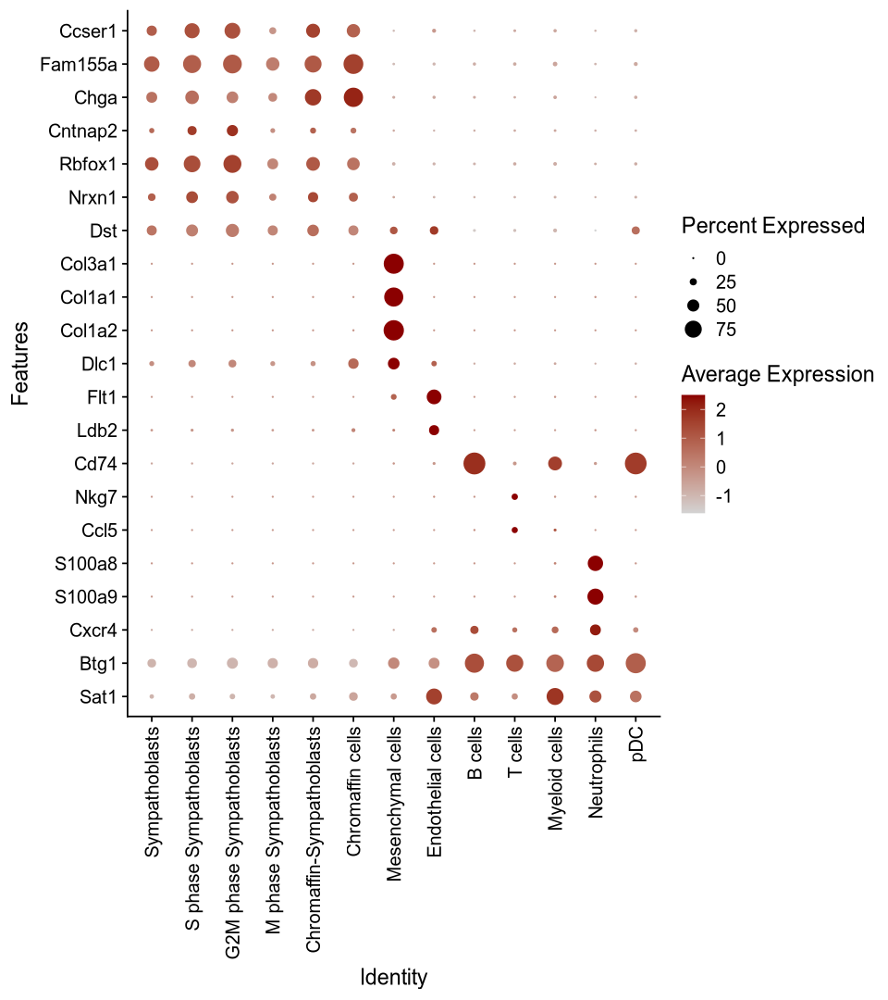

In [115]:
gene_order = c(
    'Ccser1','Fam155a','Chga',
    'Cntnap2','Rbfox1',
    'Nrxn1','Dst',
    'Col3a1','Col1a1','Col1a2',
    'Dlc1',
    'Flt1','Ldb2',
     'Cd74',
    'Nkg7','Ccl5',
    'S100a8','S100a9',
    'Cxcr4','Btg1',
    'Sat1'
)
fig.size(9,8)
phemi = DotPlot(
        hemi, 
        assay='RNA',
        features = gene_order %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1,vjust=0.5))
phemi

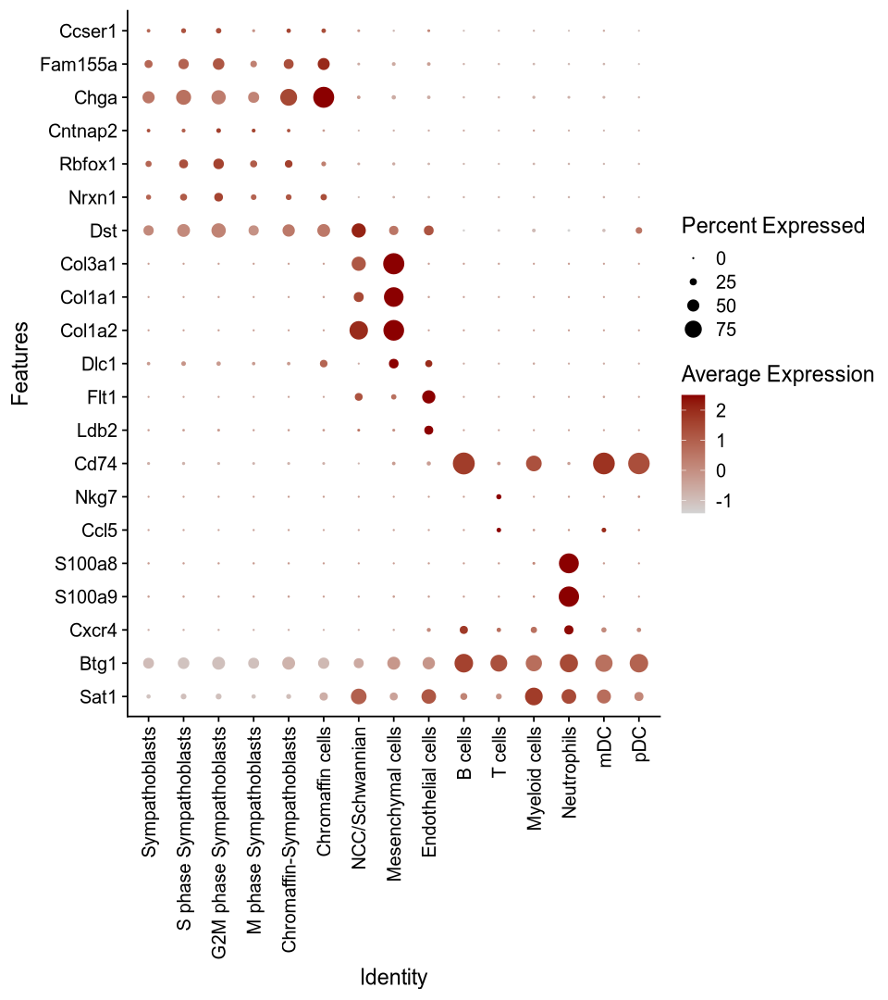

In [114]:
gene_order = c(
    'Ccser1','Fam155a','Chga',
    'Cntnap2','Rbfox1',
    'Nrxn1','Dst',
    'Col3a1','Col1a1','Col1a2',
    'Dlc1',
    'Flt1','Ldb2',
     'Cd74',
    'Nkg7','Ccl5',
    'S100a8','S100a9',
    'Cxcr4','Btg1',
    'Sat1'
)
fig.size(9,8)
phomo = DotPlot(
        homo, 
        assay='RNA',
        features = gene_order %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1,vjust=0.5))
phomo

In [116]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240808_FigureR1A_Homozygous_cellxgene.pdf'),
    plot= phomo, 
    height = 9,
    width = 8,
    create.dir=TRUE
      )

In [117]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240808_FigureR1A_Hemizygous_cellxgene.pdf'),
    plot= phemi, 
    height = 9,
    width = 8,
    create.dir=TRUE
      )

In [121]:
Idents(hemi) = "annot"

In [122]:
DefaultAssay(hemi) = "RNA"
hemi_markers_RNA =  FindAllMarkers(
    hemi, 
    min.pct =  0.25, 
    min.diff.pct = 0.25
)

Calculating cluster Sympathoblasts

Calculating cluster S phase Sympathoblasts

Calculating cluster G2M phase Sympathoblasts

Calculating cluster M phase Sympathoblasts

Calculating cluster Chromaffin-Sympathoblasts

Calculating cluster Chromaffin cells

Calculating cluster Mesenchymal cells

Calculating cluster Endothelial cells

Calculating cluster B cells

Calculating cluster T cells

Calculating cluster Myeloid cells

Calculating cluster Neutrophils

Calculating cluster pDC



In [123]:
saveRDS(hemi_markers_RNA,'new_5_hemi_samples_annotated_DE.rds')

In [162]:
library(ggsignif)
library(ggpubr)

In [144]:
comparisons <- common_annot %>%
  lapply(function(x) c("hemi", "homo"))

In [151]:
combined_data %>% head

orig.ident,annot,N,dataset
<chr>,<chr>,<dbl>,<chr>
het1,Sympathoblasts,0.4287492,hemi
het2,Sympathoblasts,0.4106542,hemi
het3,Sympathoblasts,0.4522557,hemi
het4,Sympathoblasts,0.3909289,hemi
het5,Sympathoblasts,0.4252192,hemi
het1,S phase Sympathoblasts,0.2109521,hemi


In [186]:
significance_results <- combined_data %>%
  group_by(annot) %>%
  summarise(p.value = wilcox.test(N[dataset == "hemi"], N[dataset == "homo"])$p.value) %>%
  filter(p.value < 0.05) %>%
  mutate(significance = ifelse(p.value < 0.01, "**", "*"))

In [206]:
combined_data %>%
  group_by(annot) %>%
  summarise(p.value = wilcox.test(N[dataset == "hemi"], N[dataset == "homo"])$p.value)

annot,p.value
<chr>,<dbl>
B cells,0.055555556
Chromaffin cells,0.690476190
Chromaffin-Sympathoblasts,0.007936508
Endothelial cells,0.150793651
G2M phase Sympathoblasts,0.007936508
M phase Sympathoblasts,0.841269841
Mesenchymal cells,0.150793651
Myeloid cells,0.309523810
Neutrophils,0.690476190


In [196]:
y_positions <- combined_data %>%
  filter(annot %in% significance_results$annot) %>%
  group_by(annot) %>%
  summarise(y.position = max(N) + 1)

# Merge y_positions into significance_results
significance_results <- significance_results %>%
  left_join(y_positions, by = "annot") %>%
  mutate(dataset = "hemi")  # Create a dummy dataset column for compatibility

# Create comparisons list for ggsignif with only significant annotations
significant_comparisons <- significance_results$annot %>%
  lapply(function(x) list(c("hemi", "homo")))

In [197]:
significance_results <- significance_results %>%
  left_join(y_positions, by = "annot") %>%
  mutate(dataset = "hemi") 

In [198]:
significance_results

annot,p.value,significance,y.position.x,dataset,y.position.y,y.position.x.x,y.position.y.y,y.position
<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Chromaffin-Sympathoblasts,0.007936508,**,5.167384,hemi,5.167384,1.167384,1.167384,1.167384
G2M phase Sympathoblasts,0.007936508,**,5.069836,hemi,5.069836,1.069836,1.069836,1.069836


Warning message:
“Computation failed in `stat_signif()`.
Caused by error in `if (scales$x$map(comp[1]) == data$group[1] | manual) ...`:
! missing value where TRUE/FALSE needed”


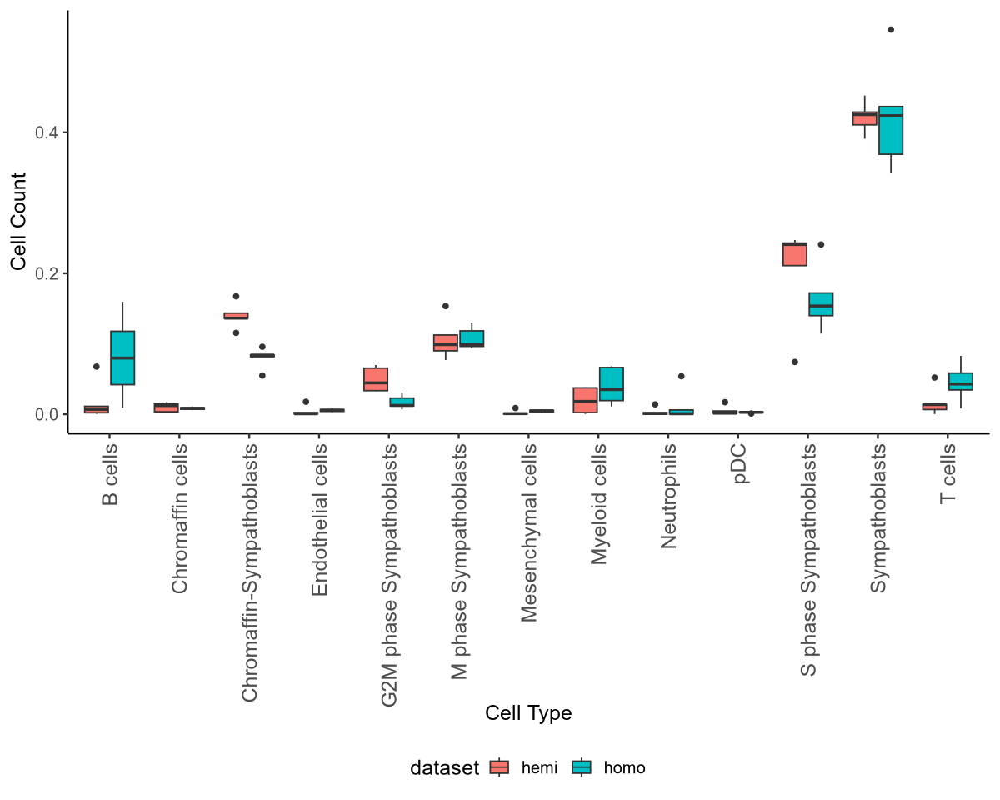

In [192]:
fig.size(8,10)
ggplot(combined_data, aes(x = annot, y = N, fill = dataset)) +
  geom_boxplot() +
  theme_classic(base_size = 15) +
  theme(legend.position = "bottom", axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5,size=15)) +
  labs(y = "Cell Count", x = "Cell Type") +
  geom_signif(
    comparisons = comparisons,
    map_signif_level = TRUE,
    test = "wilcox.test",
    y_position = y_positions,
    tip_length = 0.01,
    vjust = 0.5
  )

In [200]:
y_positions

annot,y.position
<chr>,<dbl>
Chromaffin-Sympathoblasts,1.167384
G2M phase Sympathoblasts,1.069836


In [201]:
significance_results

annot,p.value,significance,y.position.x,dataset,y.position.y,y.position.x.x,y.position.y.y,y.position
<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Chromaffin-Sympathoblasts,0.007936508,**,5.167384,hemi,5.167384,1.167384,1.167384,1.167384
G2M phase Sympathoblasts,0.007936508,**,5.069836,hemi,5.069836,1.069836,1.069836,1.069836


Warning message:
“Computation failed in `stat_signif()`.
Caused by error in `if (scales$x$map(comp[1]) == data$group[1] | manual) ...`:
! missing value where TRUE/FALSE needed”


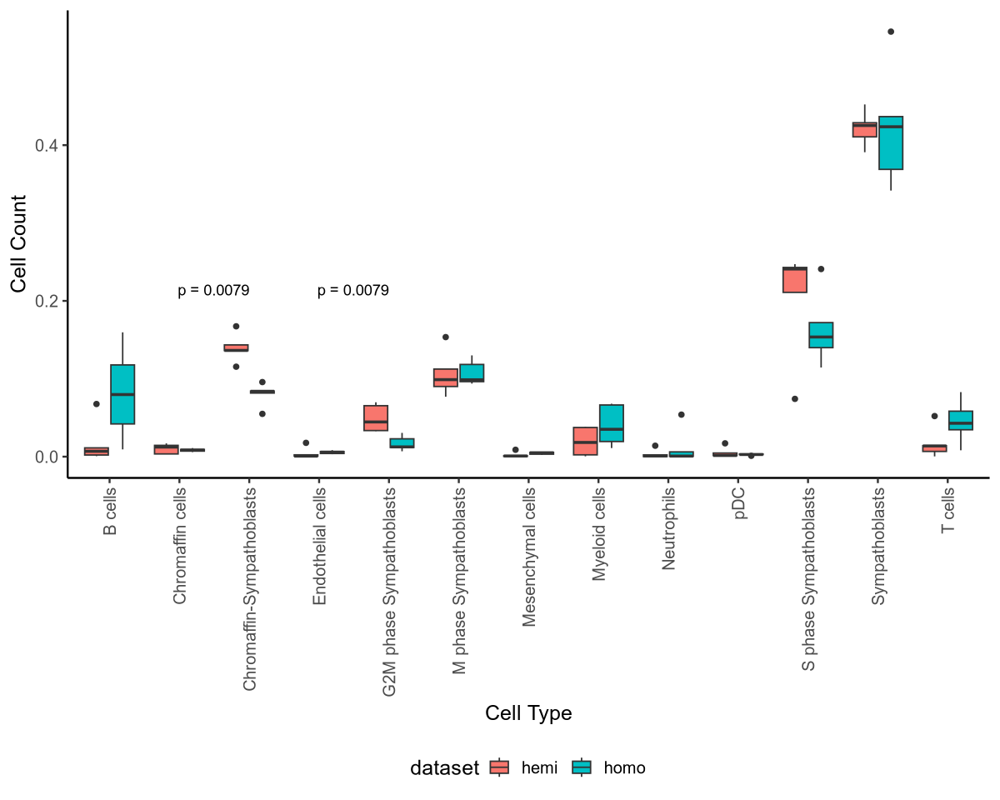

In [205]:
significant_comparisons <- significance_results$annot %>%
  lapply(function(x) c("hemi", "homo"))


fig.size(8,10)
ggplot(combined_data, aes(x = annot, y = N, fill = dataset)) +
  geom_boxplot() +
  #scale_fill_manual(values = c("hemi" = "blue", "homo" = "red")) +
  theme_classic(base_size = 15) +
  theme(
    legend.position = "bottom",
    axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5)
  ) +
  labs(y = "Cell Count", x = "Cell Type") +
  geom_signif(
    comparisons = significant_comparisons,
    annotations = significance_results$significance,
    map_signif_level = TRUE,
    y_position = significance_results$y.position,
    tip_length = 0.01,
    vjust = 0.5
  ) +
  geom_text(
    data = significance_results,
    aes(x = annot, y = 0.2, label = paste0("p = ", format(p.value, digits = 2))),
    vjust = -0.5,
    hjust = 1
  )


In [174]:
significance_results

annot,p.value,significance
<chr>,<dbl>,<chr>
Chromaffin-Sympathoblasts,0.007936508,**
G2M phase Sympathoblasts,0.007936508,**


In [ ]:
geom_signif(
    comparisons = comparisons,
    map_signif_level = TRUE,
    test = "wilcox.test",
    annotations = significance_results$significance,
    y_position = y_positions,
    tip_length = 0.01,
    vjust = 0.5
  ) +
  geom_text(
    data = significance_results,
    aes(x = annot, y = y_positions, label = paste0("p = ", format(p.value, digits = 2))),
    vjust = -0.5,
    hjust = 1
  )